In [1]:
## 2026.09.15 Xenium CRC P2 — three-head Hist2Pheno train / validate
## Sample key: P2CRC  |  Excel sheet / data folder: P2_CRC
## Labels: transferred Visium HD RCTD singlet (DeconvolutionLabel1), not native Xenium GT.
## Hierarchy: L2 fine → L12 Flex 9-class → L1 coarse (Epithelial / Stromal / Immune / Endothelial).
##
## Run demo_P2.sh steps 0–2 (optionally 3) before this notebook:
##   0  Data_process_HEcelltype_CRC.ipynb
##      python code/Xenium_crc/match_xenium_cells_with_visiumhd.py --patient P2CRC
##   1  python code/Xenium_crc/match_xenium_cells_with_pixel.py --sample P2CRC
##      writes Cases/P2CRC/P2CRC_cells_with_pixel.csv
##             Cases/P2CRC/P2CRC_cells_matched_by_stardist.csv
##   2  SAMPLE=P2CRC bash code/Xenium_crc/demo_UNI_feature_extraction_batch.sh gt
##      SAMPLE=P2CRC bash code/Xenium_crc/demo_UNI_feature_extraction_batch.sh stardist
##   3  (optional) transer_embedding_label_h5ad.py — this notebook can also build h5ad
##
## HE: data/Xemium/CRC/HE_images/Xenium_V1_Human_Colon_Cancer_P2_CRC_Add_on_FFPE_he_image.ome.tif
##     (~0.274 µm/px; UNI --scale ≈ 0.548). StarDist ~1.5M nuclei.
## Cases: data/Xemium/CRC/Cases/P2CRC/project_all_UNI/
##
## This notebook generates matched h5ad once:
##   P2CRC_matched_features.h5ad
##   P2CRC_matched_features_stardist.h5ad
##
## CLI twin (optional, P2 only — not --mode cross-dataset):
##   python -u code/Xenium_crc/CRC_train_validate_cv_UNIlabel.py --sample P2CRC \
##     --use-spatial-context --spatial-k 8 --spatial-mode mean \
##     --ablation-tag D_emph_L2_spatial_crc
##
## Spatial context defaults: use_spatial_context=True, spatial_k=8, spatial_mode='mean'


## Set env

In [2]:
import os
import sys
import importlib
import pandas as pd
import numpy as np
from pathlib import Path

## Add the code directory to Python path
path = '/home/lingyu/ssd2/Python/'
code_dir = f'{path}Hist2Pheno/code/Hist2Pheno_pkg/'
if code_dir not in sys.path:
    sys.path.insert(0, code_dir)

_crc_dir = f'{path}Hist2Pheno/code/Xenium_crc/'
if _crc_dir not in sys.path:
    sys.path.insert(0, _crc_dir)

# Unified plotting selector (avoids repeating per-tier scheme strings).
PAN_ORGAN = "xenium_crc"
# Choose GPU (must be before any torch import)
os.environ.setdefault("NCRT_CUDA_DEVICE", "0")
# Runtime env (GPU pin + tmpdir) before torch import.
from runtime_env import configure_notebook_runtime
_runtime = configure_notebook_runtime()
NCRT_PHYSICAL_GPU = _runtime["physical_gpu"]


CUDA_VISIBLE_DEVICES=0 (physical GPU 0)


## Load Hist2Pheno

In [3]:

## Import (or reload) base module
# Do NOT `import model` — that binds the name ``model`` to the *module* and will shadow
# your trained ``torch.nn.Module`` after ``globals().update(LP)`` when this cell is re-run.
import base
import plot
import model as model_pkg
## Impost：Force reload base.py
importlib.reload(base)
importlib.reload(plot)
importlib.reload(model_pkg)

import uni_label_cv_helpers as uni_nb
importlib.reload(uni_nb)
from uni_label_cv_helpers import (
    ensure_lp_extra_insample_preds,
    stardist_head_preds,
    plot_he_confusion_matrices,
    plot_he_spatial_extra_tiers,
    plot_he_f1_extra_tiers,
    build_insample_tier_metrics,
    plot_stardist_spatial_extra,
    plot_stardist_acc_extra,
    plot_stardist_confusion_extra,
    plot_stardist_f1_extra,
    plot_stardist_roc_extra,
)

## Re-import the function (otherwise, still be old_version).
from base import (
    evaluate,
    CellTypeDataset,
    evaluate_and_plot_on_all_data,
    match_hist2cell_h5ad,
    load_matched_h5ad,
    prepare_data_from_matched_h5ad,
    adata_X_to_dense,
    load_matched_features_bundle,
    encode_labels_with_class_names,
    save_hce_validation_metrics,
    collect_hce_tier_metrics_extras,
    split_train_test,
    build_spatial_neighbor_index,
    first_pth_tensor
    
)

from plot import (
    plot_celltype_spatial_distribution,
    plot_confusion_matrix,
    plot_level1_spatial_distribution,
    plot_tier_spatial_distribution,
    plot_per_class_f1,
    plot_per_class_accuracy,
    plot_level1_accuracy_from_level2_predictions,
    mlp_collect_softmax_probs,
    mlp_collect_five_head_softmax_probs,
    plot_multiclass_roc_curves,
    plot_level1_roc_from_level2_scores,
    plot_level1_f1_from_level2_predictions,
    plot_level1_accuracy_from_level1_head,
    plot_level1_f1_from_level1_head,
    plot_level1_roc_from_level1_head
)

from model import (
    get_select4_best_checkpoint_path,
    sync_best_mlp_from_logo_fold,
    load_model_for_predict,
    run_stratified_kfold_cv_with_insample_report,
    predict_all_label_heads,
)

print("Successfully reloaded functions from base.py")
print(f"CUDA_VISIBLE_DEVICES={os.environ.get('CUDA_VISIBLE_DEVICES')} (physical GPU {NCRT_PHYSICAL_GPU})")


Successfully reloaded functions from base.py
CUDA_VISIBLE_DEVICES=0 (physical GPU 0)


## Define dataset

In [4]:
## Set the path — Xenium CRC P2 (sample key P2CRC; Excel / folder P2_CRC)
from crc_paths import (
    stardist_csv_path as crc_stardist_csv_path,
    he_tif_path,
    sample_config,
    UNI_SCALE_TO_TARGET_05,
    DEFAULT_HIERARCHY_XLSX,
)

CRC_ROOT = f'{path}Hist2Pheno/data/Xemium/CRC'
CASES_ROOT = f'{CRC_ROOT}/Cases'
STARDIST_ROOT = os.environ.get(
    'STARDIST_ROOT',
    f'{CRC_ROOT}/StarDist_Segment',
)
Path(CASES_ROOT).mkdir(parents=True, exist_ok=True)
os.chdir(CASES_ROOT)

# Cases / UNI prefix / crc_paths.SAMPLES key. Excel sheet remains P2_CRC.
therapy_data = 'P2CRC'
therapy_model = 'project_all_UNI'  # Cases/{therapy_data}/project_all_UNI/
save_result = 'result'
stardist_data = 'StarDist_Segment'

# Spatial kNN neighbor UNI embeddings (CRC CLI defaults)
use_spatial_context = True
spatial_k = 8
spatial_mode = 'mean'  # 'mean' | 'attention'

acq_id = therapy_data  # UNI --dataset sc_{sample} → pth prefix sc_P2CRC

SAMPLE_DIR = f'{CASES_ROOT}/{therapy_data}'
MODEL_DIR = f'{SAMPLE_DIR}/{therapy_model}'
Path(SAMPLE_DIR).mkdir(parents=True, exist_ok=True)

# Preprocessed CSV inputs (from match_xenium_cells_with_pixel.py)
cell_coords_path = f'{SAMPLE_DIR}/{therapy_data}_cells_with_pixel.csv'
celltype_pixel_stardist_path = f'{SAMPLE_DIR}/{therapy_data}_cells_matched_by_stardist.csv'
stardist_raw_path = str(crc_stardist_csv_path(therapy_data, STARDIST_ROOT))

_cfg = sample_config(therapy_data)
_he_tif = he_tif_path(therapy_data)
_uni_gt_dir = Path(MODEL_DIR) / 'ImgEmbeddings_all' / 'sc_pth_16_16'
_uni_sd_dir = Path(MODEL_DIR) / 'ImgEmbeddings_all_stardist' / 'sc_pth_16_16'

print(f'therapy_data (sample)     = {therapy_data}')
print(f'Excel / data folder       = {_cfg["annotation_sheet"]}  (not the Cases dir name)')
print(f'acq_id (UNI prefix)       = {acq_id}')
print(f'MODEL_DIR                 = {MODEL_DIR}')
print(f'STARDIST_ROOT             = {STARDIST_ROOT}')
print(f'HE OME-TIFF               = {_he_tif.is_file()}  → {_he_tif}')
print(f'UNI scale (0.274→0.5 µm)  = {UNI_SCALE_TO_TARGET_05:.3f}')
print(f'hierarchy xlsx            = {Path(DEFAULT_HIERARCHY_XLSX).is_file()}  → {DEFAULT_HIERARCHY_XLSX}')
print(f'spatial_context           = {use_spatial_context} (k={spatial_k}, mode={spatial_mode!r})')
print(f'GT cells CSV exists       = {Path(cell_coords_path).is_file()}  → {cell_coords_path}')
print(f'StarDist-matched CSV      = {Path(celltype_pixel_stardist_path).is_file()}  → {celltype_pixel_stardist_path}')
print(f'StarDist_Segment CSV      = {Path(stardist_raw_path).is_file()}  → {stardist_raw_path}')
print(f'UNI GT dir exists         = {_uni_gt_dir.is_dir()}  → {_uni_gt_dir}')
print(f'UNI StarDist dir exists   = {_uni_sd_dir.is_dir()}  → {_uni_sd_dir}')

if Path(cell_coords_path).is_file():
    _cells = pd.read_csv(
        cell_coords_path, usecols=['final_CT', 'final_sublineage', 'final_lineage']
    )
    print(
        f'GT cells n={len(_cells):,}  '
        f'L2={_cells["final_CT"].nunique()}  '
        f'L12={_cells["final_sublineage"].nunique()}  '
        f'L1={_cells["final_lineage"].nunique()}'
    )
    print('L1 counts:\n' + _cells['final_lineage'].value_counts().to_string())

## Feature extraction (from repo root Hist2Pheno):
##   SAMPLE=P2CRC bash code/Xenium_crc/demo_UNI_feature_extraction_batch.sh gt
##   SAMPLE=P2CRC bash code/Xenium_crc/demo_UNI_feature_extraction_batch.sh stardist
##
## Preprocess cell tables (run once per sample before this notebook):
##   python code/Xenium_crc/match_xenium_cells_with_pixel.py --sample P2CRC


therapy_data (sample)     = P2CRC
Excel / data folder       = P2_CRC  (not the Cases dir name)
acq_id (UNI prefix)       = P2CRC
MODEL_DIR                 = /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI
STARDIST_ROOT             = /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/StarDist_Segment
HE OME-TIFF               = True  → /nobackup2/users/lingyu/Python/Hist2Pheno/data/Xemium/CRC/HE_images/Xenium_V1_Human_Colon_Cancer_P2_CRC_Add_on_FFPE_he_image.ome.tif
UNI scale (0.274→0.5 µm)  = 0.548
hierarchy xlsx            = True  → /nobackup2/users/lingyu/Python/Hist2Pheno/data/Xemium/CRC/Annotation/CRC_Barcode_Cell_Type_Matrices.xlsx
spatial_context           = True (k=8, mode='mean')
GT cells CSV exists       = True  → /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/P2CRC_cells_with_pixel.csv
StarDist-matched CSV      = True  → /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/P2CRC_cells_matched_by_stardist.csv
StarDis

In [5]:
## Result figures: name → filename under .../{therapy_model}/result
from uni_label_cv_helpers import RESULT_FIG, make_result_fig

# Canonical CRC layout: Cases/{sample}/{model}/result/  (SELECT4_ROOT is the Cases alias)
SELECT4_ROOT = CASES_ROOT
_result_dir = f'{SELECT4_ROOT}/{therapy_data}/{therapy_model}/{save_result}'
FIG = RESULT_FIG
result_fig, _result_dir_path = make_result_fig(SELECT4_ROOT, therapy_data, therapy_model, save_result)
BEST_MLP_PATH = f'{MODEL_DIR}/best_mlp_gpu.pt'
print('result_dir =', _result_dir_path)
print('best_mlp  =', BEST_MLP_PATH)


result_dir = /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result
best_mlp  = /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/best_mlp_gpu.pt


In [6]:
## CUDA/CPU sanity check + reproducibility (delegated to Hist2Pheno_pkg)
from torch_runtime import configure_torch_runtime

SEED = 42
TORCH_CUDA_INDEX = 0

_runtime = configure_torch_runtime(seed=SEED, torch_cuda_index=TORCH_CUDA_INDEX)

# Keep the same variable names used downstream.
device = _runtime.device
amp_scaler = _runtime.amp_scaler
CUDA_DEVICE_INDEX = _runtime.cuda_device_index
PHYSICAL_GPU = _runtime.physical_gpu


/nobackup2/users/lingyu/conda_envs/SeededNTM/bin/python
torch 2.9.1+cu130 | built with CUDA: 13.0 | cuda.is_available: True
CUDA_VISIBLE_DEVICES='0' -> physical GPU(s) '0'
Using physical GPU 0 as logical cuda:0 | NVIDIA RTX PRO 6000 Blackwell Server Edition
device: cuda:0 | physical GPU 0 | NVIDIA RTX PRO 6000 Blackwell Server Edition
Reproducibility configured with SEED=42


### Load image feature

In [7]:
hist_embedding_dir = Path(f'{MODEL_DIR}/ImgEmbeddings_all/sc_pth_16_16')
print(hist_embedding_dir)
tensor = first_pth_tensor(hist_embedding_dir)


/home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/ImgEmbeddings_all/sc_pth_16_16
Found file: /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/ImgEmbeddings_all/sc_pth_16_16/sc_P2CRC_63806.887_5926.769.pth
Loaded type: <class 'tuple'>
tensor.shape of the first .pth file: torch.Size([1, 1, 1024])


Example UNI embedding dir for P2CRC (prefix `sc_P2CRC`, `--scale` ≈ 0.548):

`{CASES_ROOT}/{therapy_data}/project_all_UNI/ImgEmbeddings_all/sc_pth_16_16`

e.g. `/home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/ImgEmbeddings_all/sc_pth_16_16`

Each `.pth` is typically `torch.Size([1, 1, 1024])`. StarDist embeddings live in `ImgEmbeddings_all_stardist/`.


## Cell Type Classification Model

Stratified k-fold CV on Xenium CRC P2 (`P2CRC`; Excel sheet `P2_CRC`).
Labels are transferred Visium HD RCTD singlet, not native Xenium GT.
Three-head hierarchy: L2 fine (`final_CT`) / L12 intermediate (`final_sublineage`) / L1 coarse (`final_lineage`).
`Unlabeled` cells are dropped in `match_xenium_cells_with_pixel.py` (empty L12/L1 parents).


In [8]:
## Match UNI embeddings → AnnData (.h5ad) for Xenium CRC P2 (three-head hierarchy)
# Excel P2_CRC / celltype sheet: L2 fine → L12 Flex 9-class → L1 coarse (transferred RCTD).
# Internal names after match: celltype_level2 / celltype_level1 / celltype_level0.
#
# CSV input is prebuilt by code/Xenium_crc/match_xenium_cells_with_pixel.py:
#   {SAMPLE_DIR}/{therapy_data}_cells_with_pixel.csv
# This cell only builds matched_features.h5ad (generate once; reuse when present).
from crc_paths import load_crc_celltype_hierarchy, DEFAULT_HIERARCHY_XLSX

hierarchy_df = load_crc_celltype_hierarchy(DEFAULT_HIERARCHY_XLSX)
print(hierarchy_df.nunique().rename("n_classes").to_string())

# Prefer paths defined in the path-setup cell; fall back if re-run out of order.
cell_coords_path = globals().get(
    'cell_coords_path', f'{SAMPLE_DIR}/{therapy_data}_cells_with_pixel.csv'
)
matched_h5ad_path = f'{SAMPLE_DIR}/{therapy_data}_matched_features.h5ad'
hist_embedding_dir = Path(f'{MODEL_DIR}/ImgEmbeddings_all/sc_pth_16_16')
pth_prefix_gt = f'sc_{acq_id}'

if not Path(cell_coords_path).is_file():
    raise FileNotFoundError(
        f"Missing preprocessed GT table: {cell_coords_path}\n"
        "Run: conda run -n SeededNTM python code/Xenium_crc/match_xenium_cells_with_pixel.py "
        f"--sample {therapy_data}"
    )
print(f'Using preprocessed GT cells: {cell_coords_path}')

# Internal model naming: L2=fine, L12=intermediate, L1=coarse.
column_rename = {
    'final_CT': 'celltype',
    'final_sublineage': 'celltype_level12',
    'final_lineage': 'celltype_level1',
}
match_tolerance = 1.0

# Build matched h5ad once. Set True only after changing hierarchy / embeddings / CSV.
FORCE_REBUILD_MATCHED_H5AD = False
if not Path(matched_h5ad_path).is_file():
    FORCE_REBUILD_MATCHED_H5AD = True
print(f'FORCE_REBUILD_MATCHED_H5AD = {FORCE_REBUILD_MATCHED_H5AD}')

adata = match_hist2cell_h5ad(
    cell_coords_path=cell_coords_path,
    hist_embedding_dir=hist_embedding_dir,
    matched_h5ad_path=matched_h5ad_path,
    coord_cols=('X_pix_HE', 'Y_pix_HE'),
    tolerance=match_tolerance,
    pth_prefix=pth_prefix_gt,
    level1_name='celltype_level1',
    column_rename=column_rename,
    auto_rename=False,
    force_rebuild=FORCE_REBUILD_MATCHED_H5AD,
    obs_columns=base.HCC_H5AD_OBS_COLUMNS,
    cell_id_col='cell_id',
)
print(adata)
print('obs columns:', list(adata.obs.columns))
print('obsm keys:', list(adata.obsm.keys()))


celltype_level2    38
celltype_level1     9
celltype_level0     4
Using preprocessed GT cells: /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/P2CRC_cells_with_pixel.csv
FORCE_REBUILD_MATCHED_H5AD = True
Loading celltype Ground Truth ...
  Column rename applied: {'final_CT': 'celltype'}
  Loaded 209779 cells
  Cell types: 36 unique types

Loading HIPT embeddings (full scan: 209,779 .pth files, cap=400,000; skipping selective path probe).
  Loading embeddings...


Loading .pth files (workers=16): 100%|██████████| 209779/209779 [03:22<00:00, 1035.12it/s]


  Successfully loaded 209779 embeddings
  Embedding dimension: (1024,)

Matching embeddings with celltype data (this may take a few minutes)...
  Using specified coordinates: X_pix_HE, Y_pix_HE
  Building KDTree for embeddings: 209,779 points
  KDTree matched 209,779 / 209,779 cells (100.00%).
  Matched 209779 cells out of 209779
  Match rate: 100.00%
  ✓ Saved matched h5ad to /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/P2CRC_matched_features.h5ad (209,779 cells × 1024 features)
AnnData object with n_obs × n_vars = 209779 × 1024
    obs: 'final_CT', 'final_lineage', 'final_sublineage', 'tma'
    uns: 'cell_coords_path', 'matched_n_cells', 'embedding_dim'
    obsm: 'spatial', 'spatial_HE'
obs columns: ['final_CT', 'final_lineage', 'final_sublineage', 'tma']
obsm keys: ['spatial', 'spatial_HE']


In [9]:
# Prep CV arrays for CRC three-head hierarchy.
from sklearn.preprocessing import StandardScaler

cv_data = prepare_data_from_matched_h5ad(
    adata,
    groups=np.arange(adata.n_obs, dtype=np.int64),
    require_niche_heads=False,
)
USE_THREE_HEAD = "y_level12_encoded_f" in cv_data
USE_FIVE_HEAD = False
print(
    "Three-head training (CRC): "
    "L2=final_CT (celltype_level2), "
    "L12=final_sublineage (celltype_level1), "
    "L1=final_lineage (celltype_level0)"
)

class_names = cv_data["class_names"]
class_names_level1 = cv_data["class_names_level1"]
class_names_level12 = cv_data["class_names_level12"]
class_names_level3 = class_names_level4 = None
le_level2 = cv_data["le_level2"]
le_level1 = cv_data["le_level1"]

scaler = StandardScaler()
scaler.fit(cv_data["X_f"])
X_coords_plot = cv_data.get("X_coords_f")

# Spatial kNN neighbor index (CRC CLI defaults: k=8, mean)
spatial_neighbor_index = None
if use_spatial_context:
    if X_coords_plot is None:
        raise ValueError("use_spatial_context=True requires X_coords_f in cv_data / spatial_HE in h5ad.")
    spatial_neighbor_index = build_spatial_neighbor_index(
        np.asarray(X_coords_plot), k_neighbors=spatial_k
    )
    print(
        f"Spatial context: k={spatial_k}, mode={spatial_mode!r}, "
        f"neighbor_index shape={spatial_neighbor_index.shape}"
    )

X = adata_X_to_dense(adata.X)
y = adata.obs["final_CT"].to_numpy()
y_level1 = adata.obs["final_lineage"].to_numpy()
y_level12 = adata.obs["final_sublineage"].to_numpy()
y_level3 = y_level4 = None
X_coords_matched = adata.obsm["spatial_HE"]
matched_features_path = matched_h5ad_path

RUN_RANDOM_TRAIN_TEST_SPLIT = False
result = split_train_test(X, y, y_level1) if RUN_RANDOM_TRAIN_TEST_SPLIT else None



Leave-one-group-out prep (filtered data):
  Samples: 209779, features: 1024
  Level2 classes: 36
  Level1 classes: 4
  Level12 classes: 9
  Coordinates: (209779, 2)
  Groups (for LOGO): 209779 unique
Three-head training (CRC): L2=final_CT (celltype_level2), L12=final_sublineage (celltype_level1), L1=final_lineage (celltype_level0)
Spatial context: k=8, mode='mean', neighbor_index shape=(209779, 8)


In [10]:
# CV fold loaders are built per ablation run; encoded labels come from cv_data (h5ad prep).
loaders = None
train_loader = val_loader = val_loader_eval = None
train_dataset = val_dataset = None
X_train_scaled = y_train_encoded = y_test_encoded = None
y_train_level1_encoded = y_test_level1_encoded = None
y_encoded_f = cv_data["y_encoded_f"]
y_level1_encoded_f = cv_data["y_level1_encoded_f"]


In [11]:
## see matched h5ad
adata = load_matched_h5ad(matched_h5ad_path)
print(adata)
print(adata.obs_names[:3], adata.var_names[:3])
print(adata.obs.columns, list(adata.obsm.keys()))

  ✓ Loaded h5ad: /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/P2CRC_matched_features.h5ad (209,779 cells × 1024 features)
AnnData object with n_obs × n_vars = 209779 × 1024
    obs: 'final_CT', 'final_lineage', 'final_sublineage', 'tma'
    uns: 'cell_coords_path', 'embedding_dim', 'matched_n_cells'
    obsm: 'spatial', 'spatial_HE'
Index(['aaaaamnm-1', 'aaaabfdb-1', 'aaaabhag-1'], dtype='object', name='cell_id') Index(['1', '2', '3'], dtype='object')
Index(['final_CT', 'final_lineage', 'final_sublineage', 'tma'], dtype='object') ['spatial', 'spatial_HE']


## MLP classifier

In [12]:
# Ablation: unified HCE weights under stratified_kfold CV
import os
import shutil
import pandas as pd

KFOLD_RESUME_FROM_CHECKPOINTS = False  # first P2 run: train; set True to reuse fold ckpts


AB_PATIENCE = 10
AB_MAX_EPOCHS = 50
AB_HIDDEN_DIMS = (1024, 512, 256)    # Model default
AB_CV_K = 5
AB_STRATIFY_TARGET = "joint"  # choices: level2 / level1 / joint

ABLATION_CONFIGS = [
    # {"tag": "B_equal", "hce_w1": 1.0, "hce_w2": 1.0, "hce_w12": 1.0},
    # {"tag": "C_emph_L1", "hce_w1": 2.0, "hce_w2": 1.0, "hce_w12": 1.0},
    {
        "tag": "D_emph_L2_spatial_crc" if use_spatial_context else "D_emph_L2_crc",
        "hce_w1": 1.0,    # celltype_level0（coarse / final_lineage）的 CE
        "hce_w2": 2.0,    # celltype_level2（fine / final_CT）的 CE
        "hce_w12": 1.0,   # level2 概率聚合到 level0 后的 mapping NLL
        "hce_w_l12head": 1.0,    # celltype_level1（intermediate / final_sublineage）的 CE
    },
    # {"tag": "E_emph_agg", "hce_w1": 1.0, "hce_w2": 1.0, "hce_w12": 2.0},
]

ablation_runs = {}
rows = []

for cfg in ABLATION_CONFIGS:
    tag = cfg["tag"]

    ckpt_dir = os.path.join(
        SELECT4_ROOT, therapy_data, therapy_model, "ablation_kfold_ckpts", tag
    )

    print("\n" + "=" * 80)
    print(f"[Ablation][stratified_kfold] Running: {tag}")
    if use_spatial_context:
        print(f"  spatial: k={spatial_k}, mode={spatial_mode!r}")
    print("=" * 80)

    LP_i = run_stratified_kfold_cv_with_insample_report(
        device=device,
        cv_data=cv_data,
        scaler=scaler,
        class_names=class_names,
        evaluate=evaluate,
        path=path,
        therapy_data=therapy_data,
        therapy_model=therapy_model,
        hce_w1=cfg["hce_w1"],
        hce_w2=cfg["hce_w2"],
        hce_w12=cfg["hce_w12"],
        hce_w_l12head=cfg.get("hce_w_l12head", 1.0),
        cv_selection_metric="three_tier_auc_sum",
        val_selection_metric="three_tier_auc_sum",
        n_splits=AB_CV_K,
        stratify_target=AB_STRATIFY_TARGET,
        patience=AB_PATIENCE,
        max_epochs=AB_MAX_EPOCHS,
        loader_kwargs={"seed": SEED, "train_balance_sampler": False},
        resume_from_checkpoints=KFOLD_RESUME_FROM_CHECKPOINTS,
        kfold_checkpoint_dir=ckpt_dir,
        hidden_dims=AB_HIDDEN_DIMS,
        use_spatial_context=use_spatial_context,
        spatial_k=spatial_k,
        spatial_mode=spatial_mode,
    )

    ablation_runs[tag] = LP_i
    score_l4 = float(
        LP_i["val_macro_f1"]
        + LP_i["val_weighted_f1"]
        + LP_i["val_level1_macro_f1"]
        + LP_i["val_level1_weighted_f1"]
    )
    rows.append(
        {
            "tag": tag,
            "hce_w1": cfg["hce_w1"],
            "hce_w2": cfg["hce_w2"],
            "hce_w12": cfg["hce_w12"],
            "hidden_dims": str(AB_HIDDEN_DIMS),
            "l2_acc": float(LP_i["val_acc"]),
            "l2_macro_f1": float(LP_i["val_macro_f1"]),
            "l2_weighted_f1": float(LP_i["val_weighted_f1"]),
            "l1_acc": float(LP_i["val_level1_acc"]),
            "l1_macro_f1": float(LP_i["val_level1_macro_f1"]),
            "l1_weighted_f1": float(LP_i["val_level1_weighted_f1"]),
            "best_epoch": int(LP_i["best_epoch"]),
            "l4_kfold_select_score": score_l4,
        }
    )

AB_SUMMARY_DF = (
    pd.DataFrame(rows)
    .sort_values("l4_kfold_select_score", ascending=False)
    .reset_index(drop=True)
)
print("\nAblation summary (sorted by l4_kfold_select_score = L2/L1 macro+weighted):")
display(AB_SUMMARY_DF)

best_tag = AB_SUMMARY_DF.iloc[0]["tag"]
LP = ablation_runs[best_tag]

best_idx = AB_SUMMARY_DF["l4_kfold_select_score"].astype(float).idxmax()
assert AB_SUMMARY_DF.iloc[best_idx]["tag"] == best_tag

best_cfg = next(c for c in ABLATION_CONFIGS if c["tag"] == best_tag)
best_fold = LP["best_fold"]
best_fold_4term_score = float(
    best_fold["l2_macro_f1"]
    + best_fold["l2_weighted_f1"]
    + best_fold["l1_macro_f1"]
    + best_fold["l1_weighted_f1"]
)

print(f"Selected best config by l4_kfold_select_score: {best_tag}")
print(
    "  Best weights: "
    f"hce_w1={best_cfg['hce_w1']}, hce_w2={best_cfg['hce_w2']}, hce_w12={best_cfg['hce_w12']}"
)
print(
    "  Best fold checkpoint in selected config: "
    f"fold={best_fold['fold']}, 4-term score={best_fold_4term_score:.4f}, path={best_fold['checkpoint']}"
)

# Sync best fold → best_mlp_gpu.pt under Select4 (same tree as kfold writes)
BEST_MLP_CHECKPOINT = sync_best_mlp_from_logo_fold(
    path,
    therapy_data,
    therapy_model,
    best_fold["checkpoint"],
    dest_path=BEST_MLP_PATH,  # Cases/{therapy_data}/project_all_UNI/best_mlp_gpu.pt
)
print(f"  Synced best_mlp_gpu.pt: {BEST_MLP_CHECKPOINT}")

# For downstream cells
globals().update(LP)
globals()["AB_SUMMARY_DF"] = AB_SUMMARY_DF
globals()["BEST_MLP_CHECKPOINT"] = BEST_MLP_CHECKPOINT
# Prefer neighbor index from trained LP (same row order as cv_data["X_f"])
if LP.get("spatial_neighbor_index") is not None:
    spatial_neighbor_index = LP["spatial_neighbor_index"]
    globals()["spatial_neighbor_index"] = spatial_neighbor_index
globals()["use_spatial_context"] = use_spatial_context
globals()["spatial_k"] = spatial_k
globals()["spatial_mode"] = spatial_mode



[Ablation][stratified_kfold] Running: D_emph_L2_spatial_crc
  spatial: k=8, mode='mean'
Spatial context: k=8, mode='mean', per-sample kNN, neighbor_index shape=(209779, 8)
  Auto CV: n_splits 5→4, stratify 'joint'→'joint' (min stratum count=4)
Train dataset size: 157334
Val dataset size: 52445
Batch size: 1024
Feature dimension: 1024

KFold fold 0: stratify='joint'
  Training: resume_from_checkpoints=False -> full HCE training for this fold.
Model configuration:
  Input dimension: 1024
  Number of level2 classes: 36
  Number of level1 classes: 4
  Number of level12 classes: 9
  Spatial context: enabled (k=8, mode='mean')
Model initialized on cuda:0
Model parameters: 2,771,505
Unified HCE: total_loss = 1.000*CE(L1) + 2.000*CE(L2) + 1.000*NLL(L1_from_L2_agg) + 1.000*CE(L12)
Loss options: l2_label_smoothing=0.0000, l1_label_smoothing=0.0000, class_weight_mode=balanced, class_balanced_beta=0.999900, l2_focal_gamma=0.0000
Validation selection metric: three_tier_auc_sum
Starting training wi

/nobackup2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (9.50s, LR: 0.000132)
  Train unified HCE: 23.3288
  CE(L1_head): 6.1222, CE(L2_head): 5.9644, NLL(L1_agg): 1.5024, CE(L12): 3.7754
  Val head macro-AUROC: L1=0.6270  L12=0.6607  L2=0.6120
  Val three-tier AUC sum: 1.8997

Epoch 2/50 (8.51s, LR: 0.000372)
  Train unified HCE: 14.9310
  CE(L1_head): 3.2755, CE(L2_head): 4.4146, NLL(L1_agg): 0.9822, CE(L12): 1.8442
  Val head macro-AUROC: L1=0.6679  L12=0.7016  L2=0.6565
  Val three-tier AUC sum: 2.0260

Epoch 3/50 (8.33s, LR: 0.000669)
  Train unified HCE: 11.0405
  CE(L1_head): 1.7990, CE(L2_head): 3.6016, NLL(L1_agg): 0.9063, CE(L12): 1.1320
  Val head macro-AUROC: L1=0.6858  L12=0.7269  L2=0.7013
  Val three-tier AUC sum: 2.1139

Epoch 4/50 (8.43s, LR: 0.000909)
  Train unified HCE: 10.0981
  CE(L1_head): 1.5195, CE(L2_head): 3.3731, NLL(L1_agg): 0.8651, CE(L12): 0.9674
  Val head macro-AUROC: L1=0.6782  L12=0.7411  L2=0.7028
  Val three-tier AUC sum: 2.1221

Epoch 5/50 (8.27s, LR: 0.001000)
  Train unified HCE: 9.4650
  

/nobackup2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (8.20s, LR: 0.000132)
  Train unified HCE: 23.0550
  CE(L1_head): 5.8749, CE(L2_head): 5.8815, NLL(L1_agg): 1.4353, CE(L12): 3.9817
  Val head macro-AUROC: L1=0.6145  L12=0.6442  L2=0.5816
  Val three-tier AUC sum: 1.8402

Epoch 2/50 (8.34s, LR: 0.000372)
  Train unified HCE: 15.0503
  CE(L1_head): 3.3140, CE(L2_head): 4.4398, NLL(L1_agg): 0.9842, CE(L12): 1.8725
  Val head macro-AUROC: L1=0.6562  L12=0.7003  L2=0.6719
  Val three-tier AUC sum: 2.0284

Epoch 3/50 (8.35s, LR: 0.000669)
  Train unified HCE: 10.9533
  CE(L1_head): 1.8248, CE(L2_head): 3.5530, NLL(L1_agg): 0.8902, CE(L12): 1.1322
  Val head macro-AUROC: L1=0.6752  L12=0.7212  L2=0.7110
  Val three-tier AUC sum: 2.1074

Epoch 4/50 (8.21s, LR: 0.000909)
  Train unified HCE: 10.0230
  CE(L1_head): 1.5264, CE(L2_head): 3.3323, NLL(L1_agg): 0.8609, CE(L12): 0.9710
  Val head macro-AUROC: L1=0.6803  L12=0.7302  L2=0.7303
  Val three-tier AUC sum: 2.1407

Epoch 5/50 (8.26s, LR: 0.001000)
  Train unified HCE: 9.5094
  

/nobackup2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (8.25s, LR: 0.000132)
  Train unified HCE: 23.3709
  CE(L1_head): 5.9341, CE(L2_head): 5.9139, NLL(L1_agg): 1.3127, CE(L12): 4.2963
  Val head macro-AUROC: L1=0.6175  L12=0.6711  L2=0.5620
  Val three-tier AUC sum: 1.8506

Epoch 2/50 (8.33s, LR: 0.000372)
  Train unified HCE: 14.9944
  CE(L1_head): 3.3508, CE(L2_head): 4.3842, NLL(L1_agg): 0.9899, CE(L12): 1.8853
  Val head macro-AUROC: L1=0.6495  L12=0.7066  L2=0.6422
  Val three-tier AUC sum: 1.9984

Epoch 3/50 (8.21s, LR: 0.000669)
  Train unified HCE: 11.0787
  CE(L1_head): 1.8100, CE(L2_head): 3.6263, NLL(L1_agg): 0.8879, CE(L12): 1.1282
  Val head macro-AUROC: L1=0.6774  L12=0.7223  L2=0.6698
  Val three-tier AUC sum: 2.0695

Epoch 4/50 (8.23s, LR: 0.000909)
  Train unified HCE: 10.0572
  CE(L1_head): 1.5188, CE(L2_head): 3.3590, NLL(L1_agg): 0.8571, CE(L12): 0.9632
  Val head macro-AUROC: L1=0.6738  L12=0.7383  L2=0.7001
  Val three-tier AUC sum: 2.1123

Epoch 5/50 (8.38s, LR: 0.001000)
  Train unified HCE: 9.5146
  

/nobackup2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (8.51s, LR: 0.000132)
  Train unified HCE: 23.4309
  CE(L1_head): 6.1554, CE(L2_head): 6.0714, NLL(L1_agg): 1.2593, CE(L12): 3.8733
  Val head macro-AUROC: L1=0.6325  L12=0.6746  L2=0.5821
  Val three-tier AUC sum: 1.8892

Epoch 2/50 (8.28s, LR: 0.000372)
  Train unified HCE: 14.4582
  CE(L1_head): 3.3196, CE(L2_head): 4.2187, NLL(L1_agg): 0.9572, CE(L12): 1.7439
  Val head macro-AUROC: L1=0.6566  L12=0.7130  L2=0.6453
  Val three-tier AUC sum: 2.0149

Epoch 3/50 (8.64s, LR: 0.000669)
  Train unified HCE: 10.8195
  CE(L1_head): 1.8246, CE(L2_head): 3.5018, NLL(L1_agg): 0.8917, CE(L12): 1.0997
  Val head macro-AUROC: L1=0.6794  L12=0.7141  L2=0.6740
  Val three-tier AUC sum: 2.0674

Epoch 4/50 (8.22s, LR: 0.000909)
  Train unified HCE: 9.9519
  CE(L1_head): 1.5158, CE(L2_head): 3.3059, NLL(L1_agg): 0.8619, CE(L12): 0.9624
  Val head macro-AUROC: L1=0.6745  L12=0.7388  L2=0.6717
  Val three-tier AUC sum: 2.0850

Epoch 5/50 (8.29s, LR: 0.001000)
  Train unified HCE: 9.4386
  C

,tag,hce_w1,hce_w2,hce_w12,hidden_dims,l2_acc,l2_macro_f1,l2_weighted_f1,l1_acc,l1_macro_f1,l1_weighted_f1,best_epoch,l4_kfold_select_score
0,D_emph_L2_spatial_crc,1.0,2.0,1.0,"(1024, 512, 256)",0.625291,0.108318,0.66222,0.807049,0.405116,0.797451,15,1.973105


Selected best config by l4_kfold_select_score: D_emph_L2_spatial_crc
  Best weights: hce_w1=1.0, hce_w2=2.0, hce_w12=1.0
  Best fold checkpoint in selected config: fold=1, 4-term score=1.7941, path=/nobackup2/users/lingyu/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/ablation_kfold_ckpts/D_emph_L2_spatial_crc/hce_kfold_fold_1.pt
sync_best_mlp_from_logo_fold: wrote '/home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/best_mlp_gpu.pt' ← '/nobackup2/users/lingyu/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/ablation_kfold_ckpts/D_emph_L2_spatial_crc/hce_kfold_fold_1.pt'
  Synced best_mlp_gpu.pt: /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/best_mlp_gpu.pt


### Note on level-1 predictions in confusion matrices

- `val_preds_level1` is obtained by aggregating L2 softmax probabilities through the hierarchy mapping matrix (mapped L1), **not** the independent L1 head argmax.
- To inspect the L1 head itself, take `logits_l1` from `forward_heads` and argmax (that path is not stored in the current `LP` object by default).



L2 celltype
Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/conf_matrix_level2.pdf


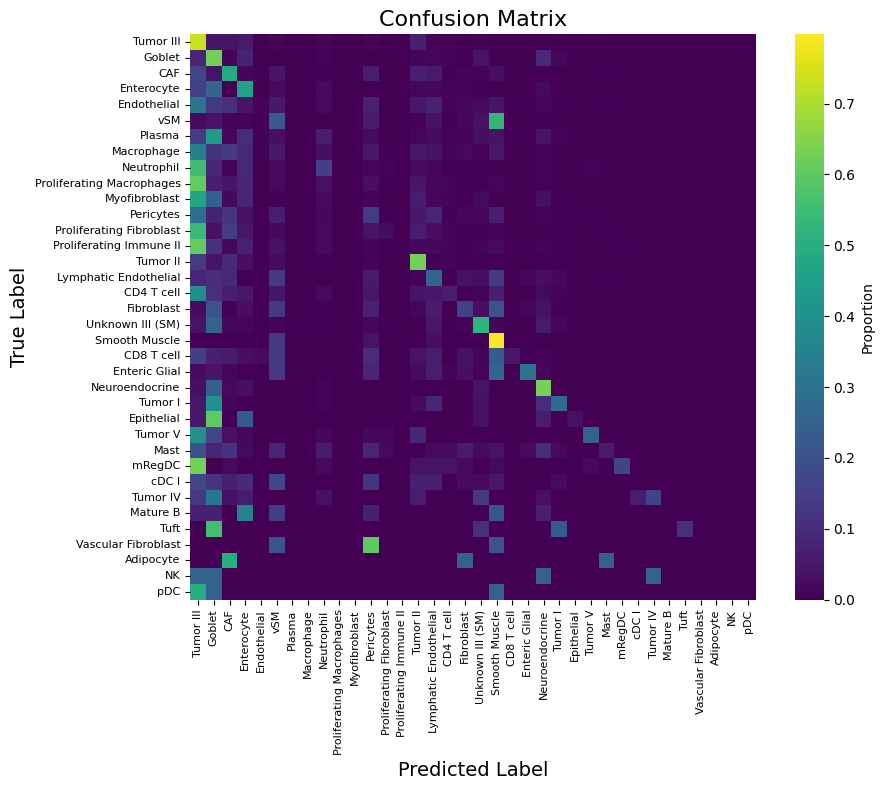


L1 lineage (L2→L1 agg)
Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/conf_matrix_level1.pdf


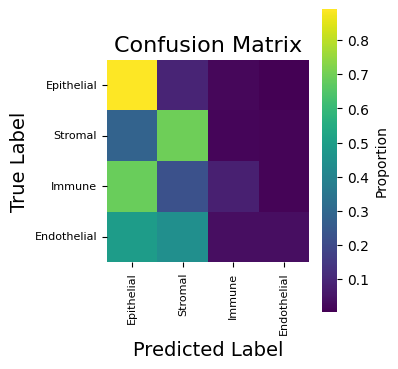


L1 lineage (L1 head)
Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/conf_matrix_level1_L1head.pdf


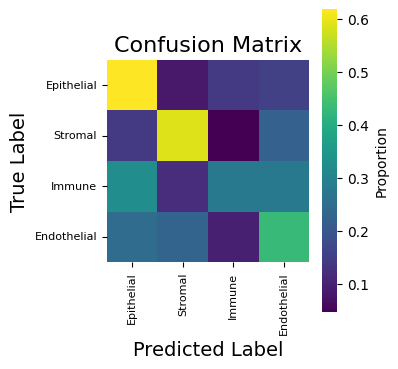


L12 sublineage
Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/conf_matrix_level12.pdf


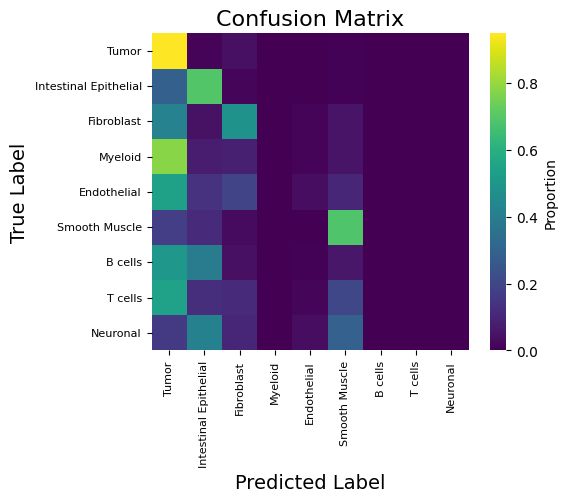

Skip L3 CNiche: no val_preds_level3 (re-run ablation cell after reload model/base)
Skip L4 TNiche: no val_preds_level4 (re-run ablation cell after reload model/base)
L1 agg vs L1 head agreement: 0.6683986481010968


In [13]:
# In-sample confusion matrices for every label tier (best-fold model in LP)
if isinstance(globals().get("LP"), dict) and LP.get("model") is not None:
    ensure_lp_extra_insample_preds(
        LP["model"],
        scaler,
        cv_data,
        device,
        predict_all_label_heads,
        globals(),
        neighbor_index=globals().get("spatial_neighbor_index"),
    )
plot_he_confusion_matrices(plot_confusion_matrix, result_fig, cv_data, globals())


In [14]:
## Save validation metrics: CV fold means + in-sample per tier (L2/L1/L12)
import numpy as np

logo_summary = globals().get("logo_summary")
if logo_summary is None and isinstance(globals().get("LP"), dict):
    logo_summary = LP.get("logo_summary")
if logo_summary is None:
    raise NameError("Run the ablation / CV cell first (globals().update(LP)) to define logo_summary.")

metrics_csv_path = result_fig("validation_internal_metrics")

hce_w1_used = globals().get("hce_w1", 1.0)
hce_w2_used = globals().get("hce_w2", 1.0)
hce_w12_used = globals().get("hce_w12", 2.0)
hce_w_l12head_used = globals().get("hce_w_l12head", 1.0)
hce_w_l3_used = globals().get("hce_w_l3", 1.0)
hce_w_l4_used = globals().get("hce_w_l4", 1.0)
mean_best_epoch = int(round(float(np.mean([f["best_epoch"] for f in logo_summary["folds"]]))))

insample_tiers, _num_classes = build_insample_tier_metrics(globals(), cv_data if "cv_data" in globals() else None)

tier_extra = collect_hce_tier_metrics_extras(
    logo_summary=logo_summary,
    insample=insample_tiers,
    num_classes=_num_classes,
)

_l2_ins = insample_tiers.get("l2") or {}
_l1_ins = insample_tiers.get("l1") or {}

metrics_df, combined_df = save_hce_validation_metrics(
    val_acc=_l2_ins.get("accuracy", float("nan")),
    val_macro_f1=logo_summary["l2_macro_f1_mean"],
    val_weighted_f1=logo_summary["l2_weighted_f1_mean"],
    val_level1_acc=_l1_ins.get("accuracy", float("nan")),
    val_level1_macro_f1=logo_summary["l1_macro_f1_mean"],
    val_level1_weighted_f1=logo_summary["l1_weighted_f1_mean"],
    class_names=class_names if "class_names" in globals() else None,
    class_names_level1=class_names_level1 if "class_names_level1" in globals() else None,
    best_epoch=mean_best_epoch,
    hce_lambda=None,
    hce_w1=hce_w1_used,
    hce_w2=hce_w2_used,
    hce_w12=hce_w12_used,
    hce_w_l12head=hce_w_l12head_used,
    hce_w_l3=hce_w_l3_used,
    hce_w_l4=hce_w_l4_used,
    therapy_data=f"{therapy_data}_kfold_CV",
    metrics_csv_path=metrics_csv_path,
    extra_metrics=tier_extra,
)

print("\nPer-tier columns in CSV (cv_* = fold mean, insample_* = all cells, best-fold model):")
_tier_cols = [c for c in combined_df.columns if c.startswith(("cv_", "insample_", "num_"))]
print(combined_df[_tier_cols].tail(1).T)


Current run metrics:
             timestamp    therapy_data  best_epoch hce_lambda  hce_w1  hce_w2  \
0  2026-09-15 01:10:42  P2CRC_kfold_CV          11       None     1.0     2.0   

   hce_w12  hce_w_l12head  hce_w_l3  hce_w_l4  ...  insample_l1_macro_f1  \
0      1.0            1.0       1.0       1.0  ...              0.405116   

   insample_l1_weighted_f1  insample_l1_head_accuracy  \
0                 0.797451                   0.594049   

   insample_l1_head_macro_f1  insample_l1_head_weighted_f1  \
0                   0.378978                      0.672291   

   insample_l12_accuracy  insample_l12_macro_f1  insample_l12_weighted_f1  \
0               0.800533                0.30537                  0.767295   

   num_l1_head_classes  num_l12_classes  
0                    4                9  

[1 rows x 56 columns]

Saved comparison table to: /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/validation_internal_metrics.csv
Total rows: 1


Visualizing per-class performance...
  ✓ Computed metrics for 36 classes
Figure saved to /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/f1_perclass_level2.pdf


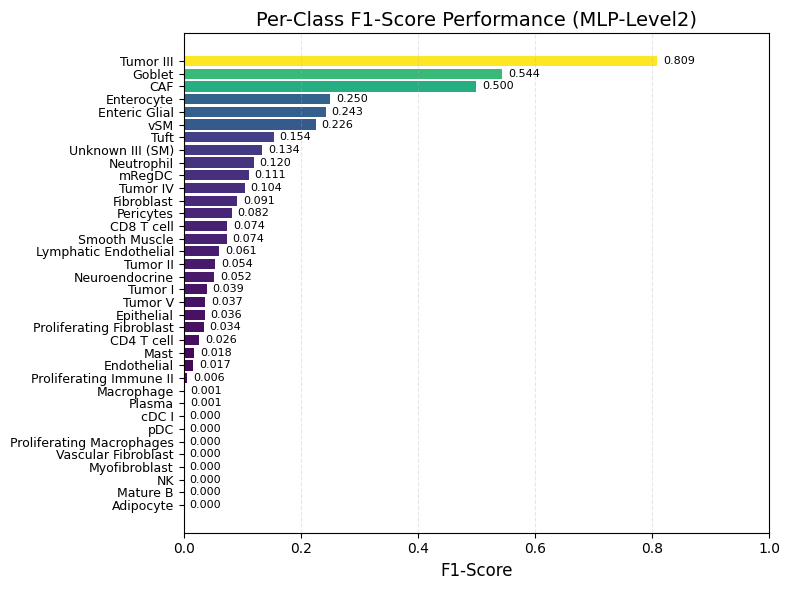


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 36
  Actual classes in test set: 36
  Feature dimension: 1024
  Model parameters: 2,771,505
  Best epoch: 15
  Test Accuracy: 0.6253
  Test Macro F1: 0.1083
  Test Weighted F1: 0.6622
Visualizing per-class performance...
  ✓ Computed metrics for 4 classes
Figure saved to /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/f1_perclass_level1.pdf


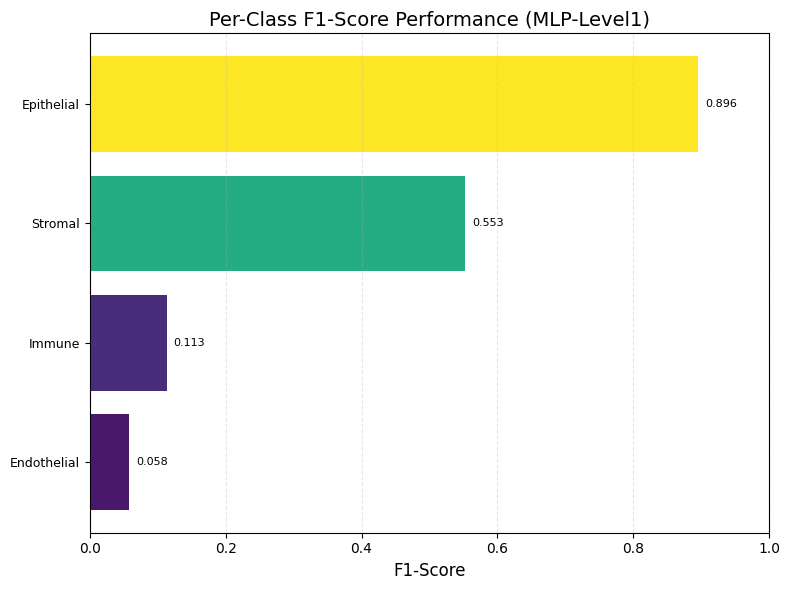


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 4
  Actual classes in test set: 4
  Feature dimension: 1024
  Model parameters: 2,771,505
  Best epoch: 15
  Test Accuracy: 0.8070
  Test Macro F1: 0.4051
  Test Weighted F1: 0.7975
Visualizing per-class performance...
  ✓ Computed metrics for 4 classes
Figure saved to /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/f1_perclass_level1_L1head.pdf


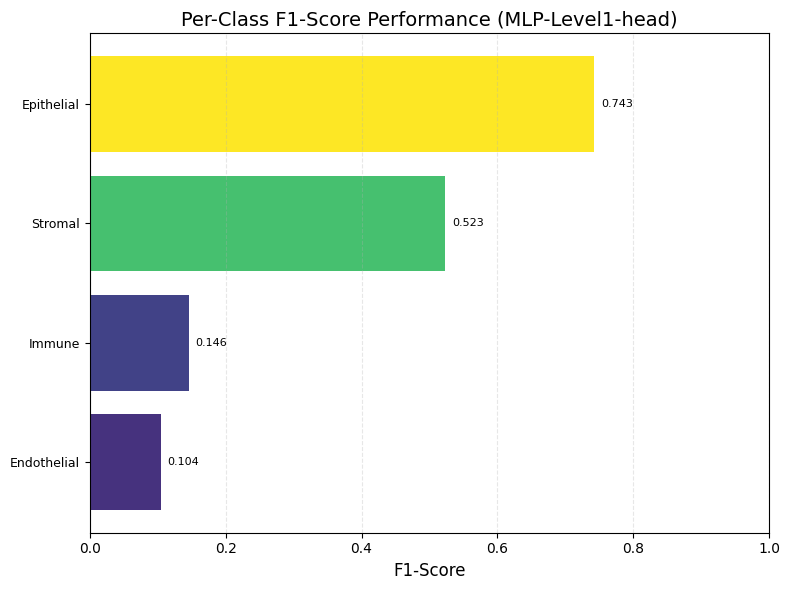


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 4
  Actual classes in test set: 4
  Feature dimension: 1024
  Model parameters: 2,771,505
  Best epoch: 15
  Test Accuracy: 0.8070
  Test Macro F1: 0.4051
  Test Weighted F1: 0.7975

L12 sublineage
Visualizing per-class performance...
  ✓ Computed metrics for 9 classes
Figure saved to /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/f1_perclass_level12.pdf


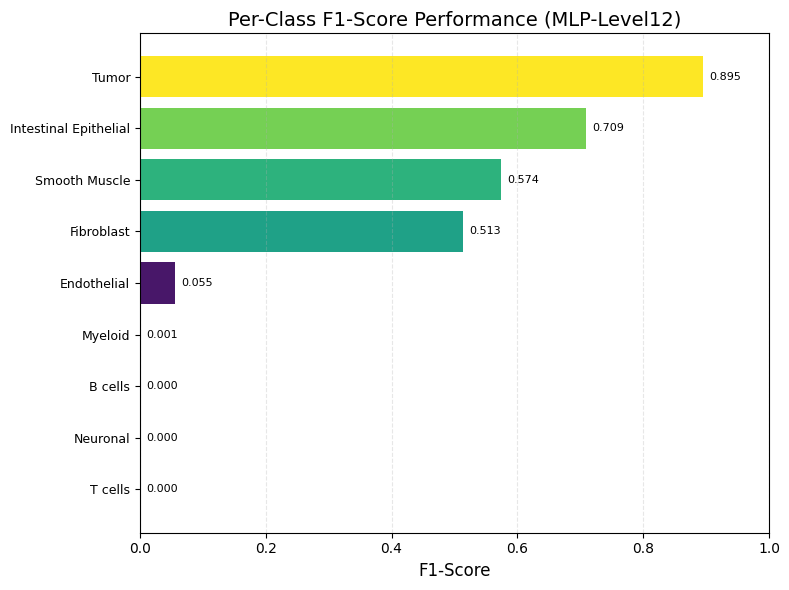


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 9
  Actual classes in test set: 9
  Feature dimension: 1024
  Model parameters: 2,771,505
  Best epoch: 15
  Test Accuracy: 0.8005
  Test Macro F1: 0.3054
  Test Weighted F1: 0.7673
Skip L3 CNiche per-class F1: no val_preds_level3
Skip L4 TNiche per-class F1: no val_preds_level4


In [15]:
# Per-class F1 for level2
metrics_df_level2 = plot_per_class_f1(
    val_labels,
    val_preds,
    class_names,
    model=model,
    device=device,
    train_dataset=train_dataset,
    val_dataset=val_dataset,
    input_dim=input_dim,
    best_epoch=best_epoch,
    test_acc=val_acc,
    test_macro_f1=val_macro_f1,
    test_weighted_f1=val_weighted_f1,
    model_name="MLP-Level2",
    y_sort_by="f1_asc",
    save_path=result_fig("f1_perclass_level2"),
)

metrics_df_level1 = plot_per_class_f1(
    val_labels_level1,
    val_preds_level1,
    class_names_level1,
    model=model,
    device=device,
    train_dataset=train_dataset,
    val_dataset=val_dataset,
    input_dim=input_dim,
    best_epoch=best_epoch,
    test_acc=val_level1_acc,
    test_macro_f1=val_level1_macro_f1,
    test_weighted_f1=val_level1_weighted_f1,
    model_name="MLP-Level1",
    y_sort_by="f1_asc",
    save_path=result_fig("f1_perclass_level1"),
)

if globals().get("val_preds_level1_head") is not None:
    plot_per_class_f1(
        val_labels_level1,
        val_preds_level1_head,
        class_names_level1,
        model=model,
        device=device,
        train_dataset=train_dataset,
        val_dataset=val_dataset,
        input_dim=input_dim,
        best_epoch=best_epoch,
        test_acc=val_level1_acc,
        test_macro_f1=val_level1_macro_f1,
        test_weighted_f1=val_level1_weighted_f1,
        model_name="MLP-Level1-head",
        y_sort_by="f1_asc",
        save_path=result_fig("f1_perclass_level1_L1head"),
    )

if isinstance(globals().get("LP"), dict) and LP.get("model") is not None:
    ensure_lp_extra_insample_preds(
        LP["model"], scaler, cv_data, device, predict_all_label_heads, globals()
    )
plot_he_f1_extra_tiers(
    plot_per_class_f1,
    result_fig,
    model,
    device,
    train_dataset,
    val_dataset,
    input_dim,
    best_epoch,
    globals(),
)


  Spatial inference: enabled (neighbor_index shape=(209779, 8))
  Using provided X and y...
  ✓ Using provided y strings as original labels for spatial TRUE plot.
  X_all_scaled shape: (209779, 1024)
  y_all_encoded shape: (209779,)
  ✓ Final y_all_encoded dtype: int64
X_all_scaled:  (209779, 1024)
y_all_encoded:  (209779,)
  ⚠ Large dataset detected (209779 samples). Setting num_workers=0 to avoid indexing issues.
  Total samples: 209779
  DataLoader batch_size: 1024, num_workers: 0

Final Performance on All Data:
  Accuracy: 0.6251
  Macro F1-score: 0.1083
  Weighted F1-score: 0.6621
all_preds:  (209779,)
unique_labels:  (36,)

Detailed Classification Report:
  Number of classes: 36
                           precision    recall  f1-score   support

                Adipocyte       0.00      0.00      0.00         4
                      CAF       0.51      0.49      0.50     15622
               CD4 T cell       0.02      0.06      0.03       341
               CD8 T cell       0.13 

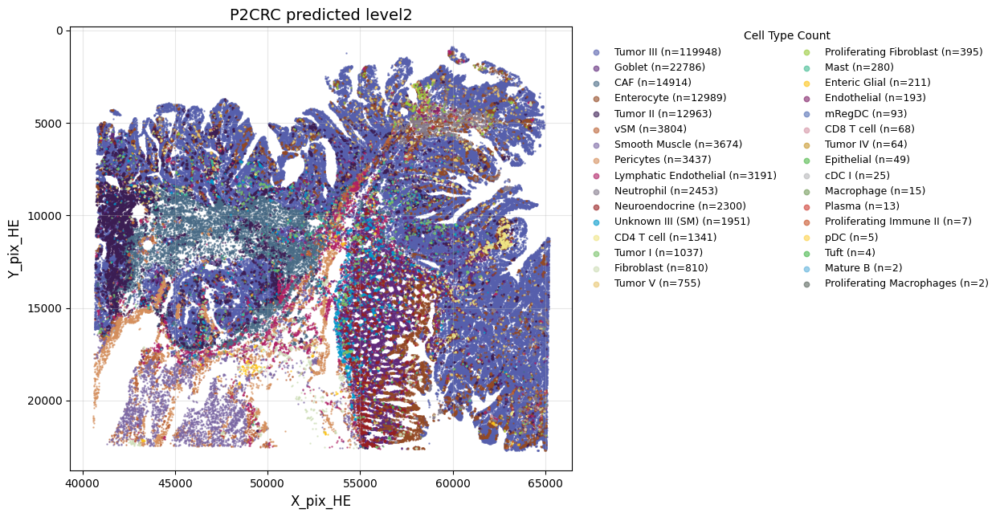


Plotting spatial distribution of TRUE level2 cell types...
Number of valid data points: 209779
Number of cell types: 36


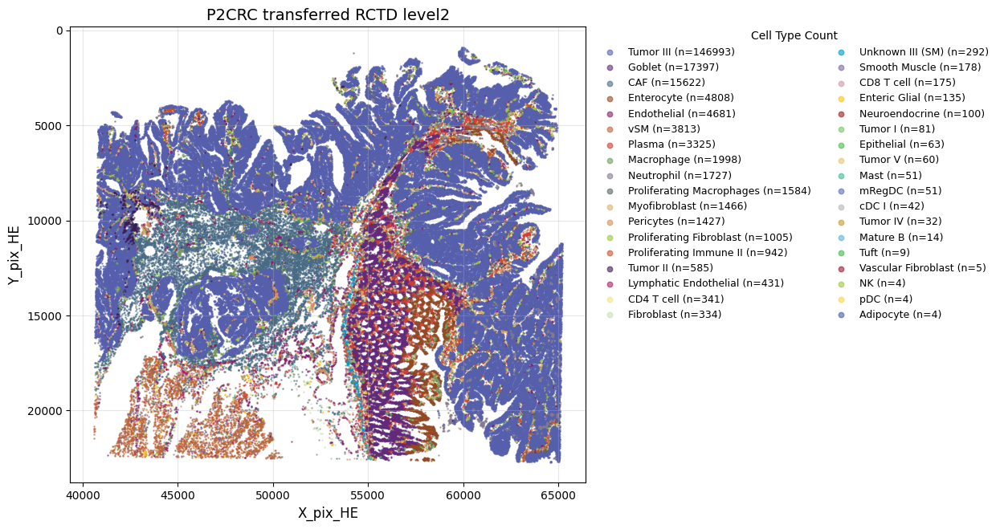

In [16]:
## Evaluate on all data: level2 spatial — predicted vs transferred RCTD
# Rows must match cv_data filter and scaler fit on X_f.
# When use_spatial_context=True, pass neighbor_index from build_spatial_neighbor_index.
_nbr = globals().get("spatial_neighbor_index")
all_acc, all_macro_f1, all_weighted_f1, all_preds, all_labels = evaluate_and_plot_on_all_data(
    model=model,
    matched_features_path="",
    class_names=class_names,
    evaluate=evaluate,
    plot_celltype_spatial_distribution=plot_celltype_spatial_distribution,
    CellTypeDataset=CellTypeDataset,
    device=device,
    scaler=scaler,
    val_loader=val_loader if "val_loader" in globals() else None,
    X=cv_data["X_f"],
    y=cv_data["y_f"],
    y_encoded=cv_data["y_encoded_f"],
    X_coords_matched=X_coords_plot if "X_coords_plot" in globals() else None,
    celltype_pred_dir=result_fig("celltype_valid_level2"),
    celltype_true_dir=result_fig("celltype_true_level2"),
    spatial_plot_mode="pred_true_l2",
    pan_organ=PAN_ORGAN,
    spatial_title_pred_l2=f"{therapy_data} predicted level2",
    spatial_title_true_l2=f"{therapy_data} transferred RCTD level2",
    celltype_pixel_NCRT_tumor1=celltype_pixel_NCRT_tumor1 if "celltype_pixel_NCRT_tumor1" in globals() else None,
    neighbor_index=_nbr,
)


Number of valid data points: 209779
Number of cell types: 4


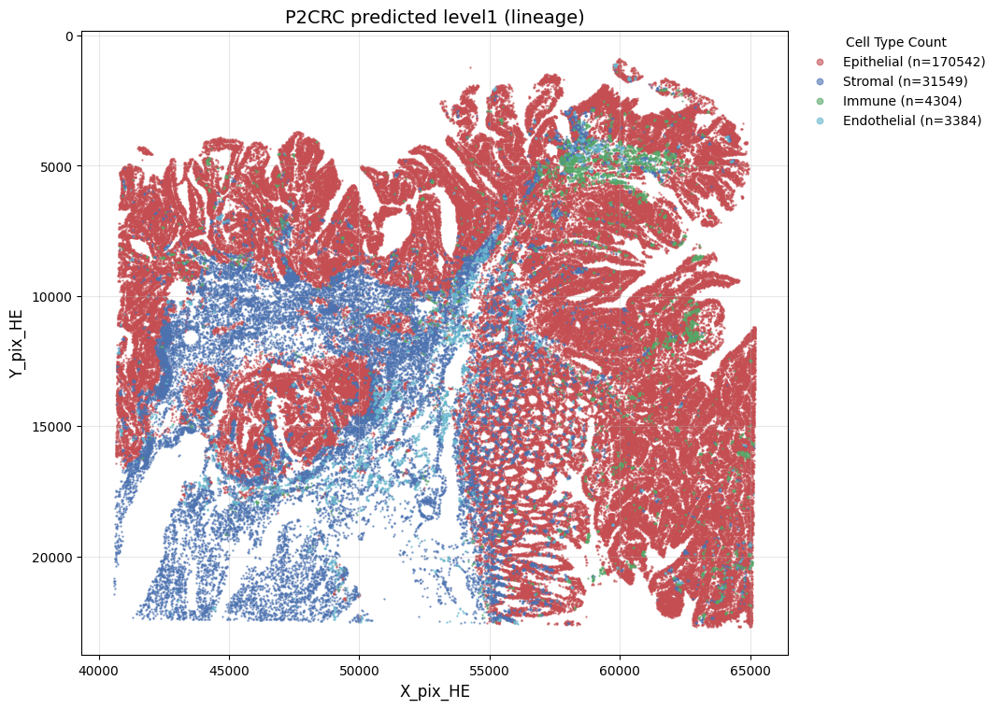

  Saved level1 predicted spatial plot: /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/celltype_valid_level1.jpg
Number of valid data points: 209779
Number of cell types: 4


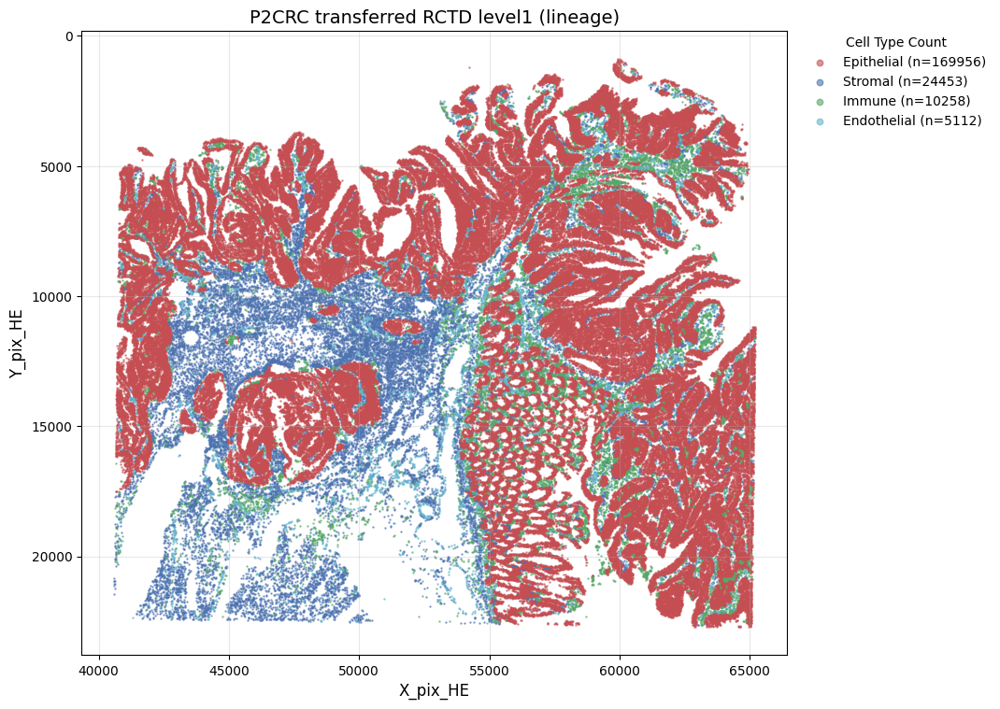

  Saved level1 true spatial plot: /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/celltype_true_level1.jpg


In [17]:
# Use the registered Xenium CRC coarse palette from the canonical package.
plot_level1_spatial_distribution(
    matched_features_path=matched_features_path,
    all_preds=all_preds,
    class_names_level1=class_names_level1,
    class_names=class_names,
    y_encoded_f=y_encoded_f,
    y_level1_encoded_f=y_level1_encoded_f,
    plot_celltype_spatial_distribution=plot_celltype_spatial_distribution,
    save_path_pred=result_fig("celltype_valid_level1"),
    save_path_true=result_fig("celltype_true_level1"),
    pan_organ=PAN_ORGAN,
    title_pred=f"{therapy_data} predicted level1 (lineage)",
    title_true=f"{therapy_data} transferred RCTD level1 (lineage)",
    fig_size=(10, 8),
    show=True,
    X_coords_matched=X_coords_plot if "X_coords_plot" in globals() else None,
    y_level1_f=cv_data["y_level1_f"],
)



L12 sublineage
Number of valid data points: 209779
Number of cell types: 8


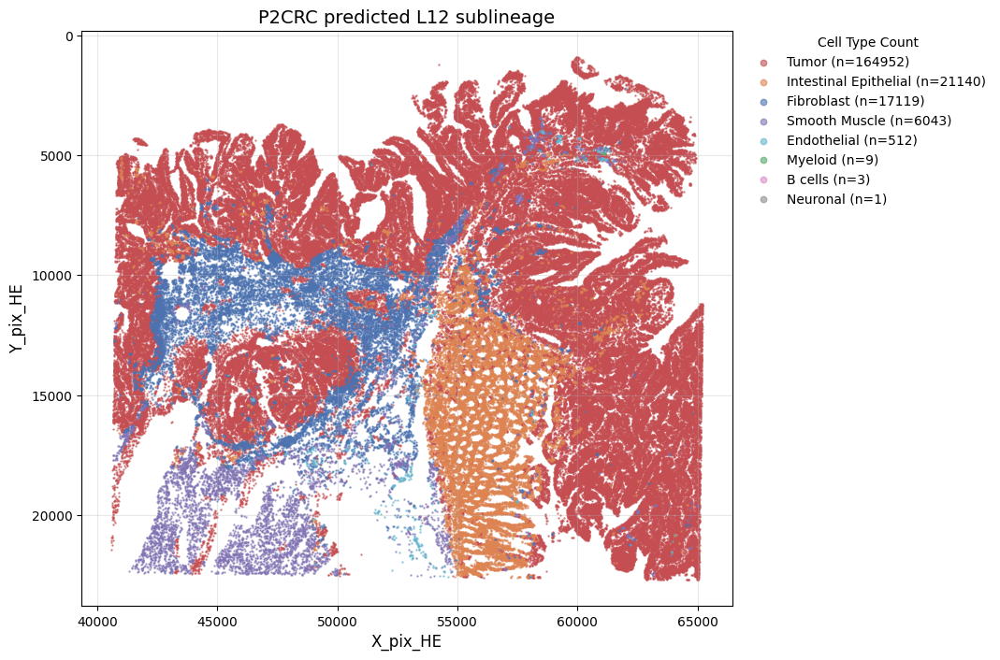

  Saved predicted spatial plot: /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/celltype_valid_level12.jpg
Number of valid data points: 209779
Number of cell types: 9


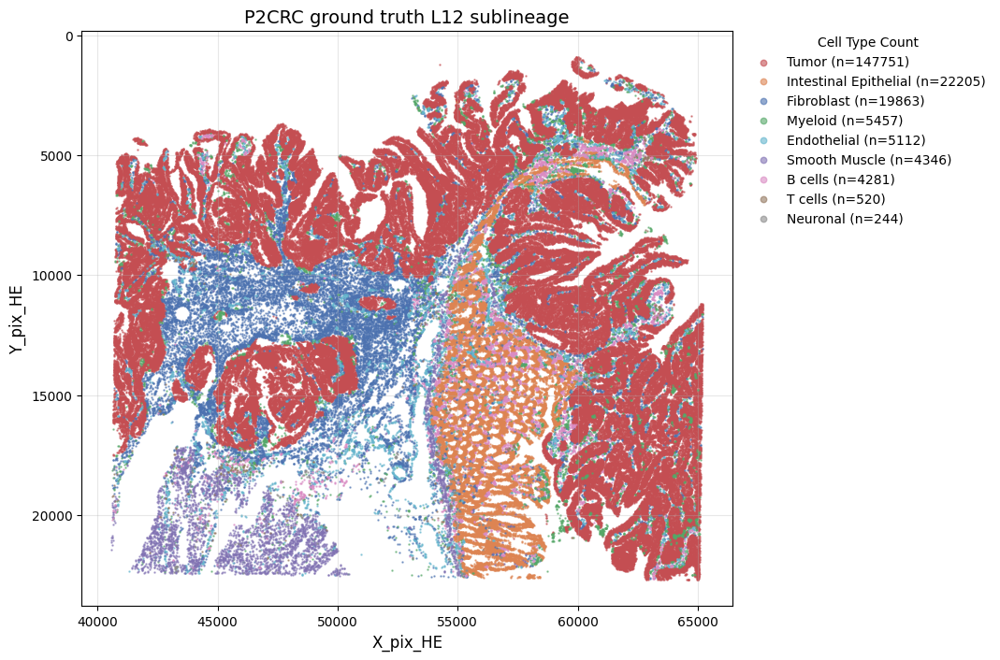

  Saved ground-truth spatial plot: /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/celltype_true_level12.jpg
Skip L3 CNiche spatial: no val_preds_level3
Skip L4 TNiche spatial: no val_preds_level4


In [18]:
## L12 intermediate hierarchy spatial — predicted vs transferred RCTD
if isinstance(globals().get("LP"), dict) and LP.get("model") is not None:
    ensure_lp_extra_insample_preds(
        LP["model"],
        scaler,
        cv_data,
        device,
        predict_all_label_heads,
        globals(),
        neighbor_index=globals().get("spatial_neighbor_index"),
    )
plot_he_spatial_extra_tiers(
    plot_tier_spatial_distribution,
    plot_celltype_spatial_distribution,
    result_fig,
    therapy_data,
    X_coords_plot if "X_coords_plot" in globals() else None,
    cv_data if "cv_data" in globals() else None,
    globals(),
    pan_organ=PAN_ORGAN,
)


## Predict StarDist

In [19]:
## Load best model for StarDist prediction.
_star_ckpt = globals().get("BEST_MLP_CHECKPOINT")
if _star_ckpt is None and isinstance(globals().get("LP"), dict):
    _bf = LP.get("best_fold")
    if isinstance(_bf, dict):
        _star_ckpt = _bf.get("checkpoint")
if _star_ckpt is None:
    _cand = BEST_MLP_PATH if "BEST_MLP_PATH" in globals() else get_select4_best_checkpoint_path(path, therapy_data, therapy_model)
    if os.path.isfile(_cand):
        _star_ckpt = _cand

model_star = load_model_for_predict(
    path,
    therapy_data,
    therapy_model,
    parent_dir=True,
    checkpoint_path=_star_ckpt,
    device=device if "device" in globals() else None,
)


Loading best model for StarDist prediction...
  Checkpoint file: /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/best_mlp_gpu.pt
  Inferred hidden_dims from checkpoint: [1024, 512, 256]
✓ StarDist model loaded


In [20]:
## StarDist matched features for Xenium CRC P2
# StarDist centroids: prepared CSV under data/Xemium/CRC/StarDist_Segment only
#   (do not rebuild from ImgEmbeddings_all_stardist/*.pth filenames).
# GT→StarDist cell table is prebuilt by match_xenium_cells_with_pixel.py:
#   {SAMPLE_DIR}/{therapy_data}_cells_matched_by_stardist.csv
# This cell only builds matched_features_stardist.h5ad (generate once; reuse when present).

hist_embedding_stardist_dir = Path(f'{MODEL_DIR}/ImgEmbeddings_all_stardist/sc_pth_16_16')
stardist_raw_path = Path(globals().get(
    'stardist_raw_path',
    crc_stardist_csv_path(therapy_data, STARDIST_ROOT),
))
if not stardist_raw_path.is_file():
    raise FileNotFoundError(
        "Prepared StarDist CSV not found under StarDist_Segment.\n"
        f"Expected: {stardist_raw_path}"
    )
print('stardist_raw_path =', stardist_raw_path)

celltype_pixel_stardist_path = globals().get(
    'celltype_pixel_stardist_path',
    f'{SAMPLE_DIR}/{therapy_data}_cells_matched_by_stardist.csv',
)
matched_features_stardist_path = f'{SAMPLE_DIR}/{therapy_data}_matched_features_stardist.h5ad'
pth_prefix_stardist = f'sc_{therapy_data}'  # UNI --dataset sc_P2CRC for both HE and StarDist

if not Path(celltype_pixel_stardist_path).is_file():
    raise FileNotFoundError(
        f"Missing preprocessed StarDist-matched table: {celltype_pixel_stardist_path}\n"
        "Run: conda run -n SeededNTM python code/Xenium_crc/match_xenium_cells_with_pixel.py "
        f"--sample {therapy_data}"
    )
print(f'Using preprocessed StarDist-matched cells: {celltype_pixel_stardist_path}')

level1_name = globals().get('level1_name', 'celltype_level1')
_column_rename = globals().get('column_rename', {
    'final_CT': 'celltype',
    'final_sublineage': 'celltype_level12',
    'final_lineage': 'celltype_level1',
})
match_tolerance = 1.0

# Build StarDist matched h5ad once. Set True only after changing CSV / embeddings.
FORCE_REBUILD_STARDIST_H5AD = False
if not Path(matched_features_stardist_path).is_file():
    FORCE_REBUILD_STARDIST_H5AD = True
print(f'FORCE_REBUILD_STARDIST_H5AD = {FORCE_REBUILD_STARDIST_H5AD}')

adata_star = match_hist2cell_h5ad(
    cell_coords_path=celltype_pixel_stardist_path,
    hist_embedding_dir=hist_embedding_stardist_dir,
    matched_h5ad_path=matched_features_stardist_path,
    coord_cols=('centroid_x', 'centroid_y'),
    tolerance=match_tolerance,
    pth_prefix=pth_prefix_stardist,
    level1_name=level1_name,
    column_rename=_column_rename,
    auto_rename=False,
    force_rebuild=FORCE_REBUILD_STARDIST_H5AD,
    obs_columns=base.HCC_H5AD_OBS_COLUMNS,
    spatial_cols=('centroid_x', 'centroid_y'),
    spatial_he_cols=('X_pix_HE', 'Y_pix_HE'),
    cell_id_col='cell_id',
)
print(adata_star)
print('obs columns:', list(adata_star.obs.columns))
print('obsm keys:', list(adata_star.obsm.keys()))

# Backward-compatible names for downstream StarDist cells
X_star = adata_X_to_dense(adata_star.X)
y_star = adata_star.obs['final_CT'].to_numpy()
y_star_level1 = adata_star.obs['final_lineage'].to_numpy()
y_star_level12 = adata_star.obs['final_sublineage'].to_numpy()
y_star_level3 = y_star_level4 = None
X_coords_star = adata_star.obsm['spatial']

# StarDist spatial kNN (for models trained with use_spatial_context)
spatial_neighbor_index_star = None
if use_spatial_context:
    spatial_neighbor_index_star = build_spatial_neighbor_index(
        np.asarray(X_coords_star), k_neighbors=spatial_k
    )
    print(
        f"StarDist spatial context: k={spatial_k}, mode={spatial_mode!r}, "
        f"neighbor_index shape={spatial_neighbor_index_star.shape}"
    )


stardist_raw_path = /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/StarDist_Segment/Xenium_V1_Human_Colon_Cancer_P2_CRC_Add_on_FFPE_he_image.ome/Xenium_V1_Human_Colon_Cancer_P2_CRC_Add_on_FFPE_he_image.ome_Float_prob0.01_nms_0.3.csv
Using preprocessed StarDist-matched cells: /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/P2CRC_cells_matched_by_stardist.csv
FORCE_REBUILD_STARDIST_H5AD = True
Loading celltype Ground Truth ...
  Column rename applied: {'final_CT': 'celltype', 'final_sublineage': 'celltype_level12', 'final_lineage': 'celltype_level1'}
  Loaded 166503 cells
  Cell types: 36 unique types

Loading HIPT embeddings from .pth files (selective mode; ≥400,000 files)...
  Selective .pth loading: 166,503 cells, tolerance=1.0, prefix='sc_P2CRC', strategy='batch'
  Selective probe layout: unique cell coordinates only (flat_fractional_stems (512/512 in sample)). Skipping lattice expansion (saves time for long-decimal flat basenames).
  Unique coordinate probes (ra

Resolve .pth paths: 100%|██████████| 166503/166503 [00:08<00:00, 18961.24it/s]


  Existing .pth paths matched: 63,166


Loading .pth (workers=16): 100%|██████████| 63166/63166 [01:01<00:00, 1032.90it/s]


  Unique .pth files read: 63,166
  Embedding coordinate keys: 63,166
  Successfully loaded 63166 embeddings
  Embedding dimension: (1024,)

Matching embeddings with celltype data (this may take a few minutes)...
  Using specified coordinates: centroid_x, centroid_y
  Building KDTree for embeddings: 63,166 points
  KDTree matched 63,166 / 166,503 cells (37.94%).
  Matched 63166 cells out of 166503
  Match rate: 37.94%
  ✓ Saved matched h5ad to /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/P2CRC_matched_features_stardist.h5ad (63,166 cells × 1024 features)
AnnData object with n_obs × n_vars = 63166 × 1024
    obs: 'final_CT', 'final_lineage', 'final_sublineage', 'tma'
    uns: 'cell_coords_path', 'matched_n_cells', 'embedding_dim'
    obsm: 'spatial', 'spatial_HE'
obs columns: ['final_CT', 'final_lineage', 'final_sublineage', 'tma']
obsm keys: ['spatial', 'spatial_HE']
StarDist spatial context: k=8, mode='mean', neighbor_index shape=(63166, 8)


  Spatial inference: enabled (neighbor_index shape=(63166, 8))
  Loading data from matched_features_path...
  ✓ Loaded X from /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/P2CRC_matched_features_stardist.h5ad: (63166, 1024)
  ✓ Loaded y from /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/P2CRC_matched_features_stardist.h5ad: (63166,), dtype: object
  ⚠ prediction_only=True: Labels will be used for visualization only, not for evaluation.
  ✓ Keeping labels as strings for visualization (no encoding needed)
  ✓ Scaled X using provided scaler
  X_all_scaled shape: (63166, 1024)
  No labels available - prediction mode only
X_all_scaled:  (63166, 1024)
dummy_labels:  (63166,)
  ⚠ Large dataset detected (63166 samples). Setting num_workers=0 to avoid indexing issues.
  Total samples: 63166
  DataLoader batch_size: 1024, num_workers: 0
  Predicting on new data (no labels for evaluation)...


Predicting: 100%|██████████| 62/62 [00:01<00:00, 45.79it/s]



Prediction completed:
  Total predictions: 63166
  Predicted classes: [ 1  2  3  4  5  6  7  8  9 10 11 12 16 17 18 19 20 21 22 23 24 25 26 27
 28 29 30 32 33 35]
  ✓ Using original labels for visualization: 63166 labels
  ✓ Computed metrics in prediction_only mode from aligned true labels: acc=0.6137, macro_f1=0.0837, weighted_f1=0.6411

Preparing spatial distribution plot...
  Matching predictions with coordinates...
  ✓ Loaded coordinates from /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/P2CRC_matched_features_stardist.h5ad: (63166, 2)
  Coordinates shape: (63166, 2)
  Predictions shape: (63166,)
  ✓ Created prediction DataFrame with 63166 cells

Plotting spatial distribution of PREDICTED level2 cell types...
Number of valid data points: 63166
Number of cell types: 30


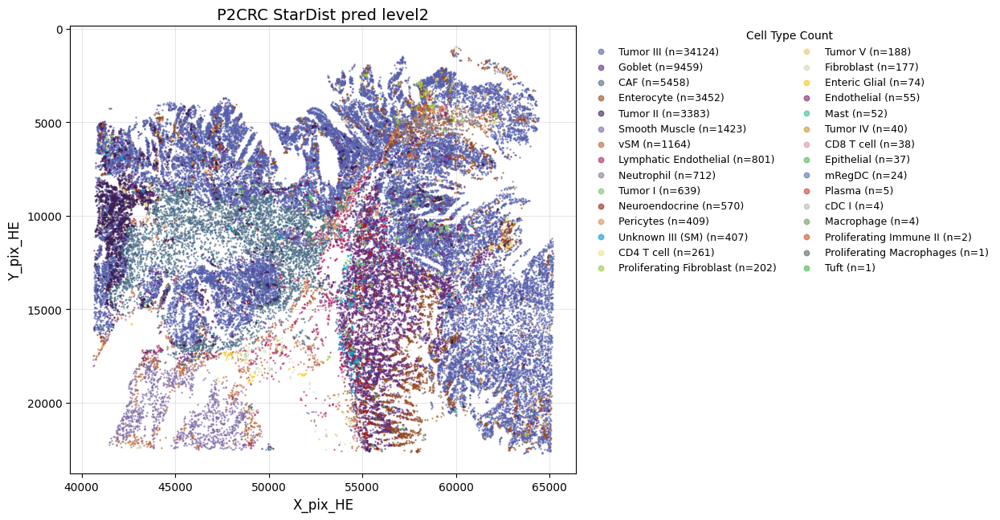


Plotting spatial distribution of TRUE level2 cell types...
Number of valid data points: 63166
Number of cell types: 36


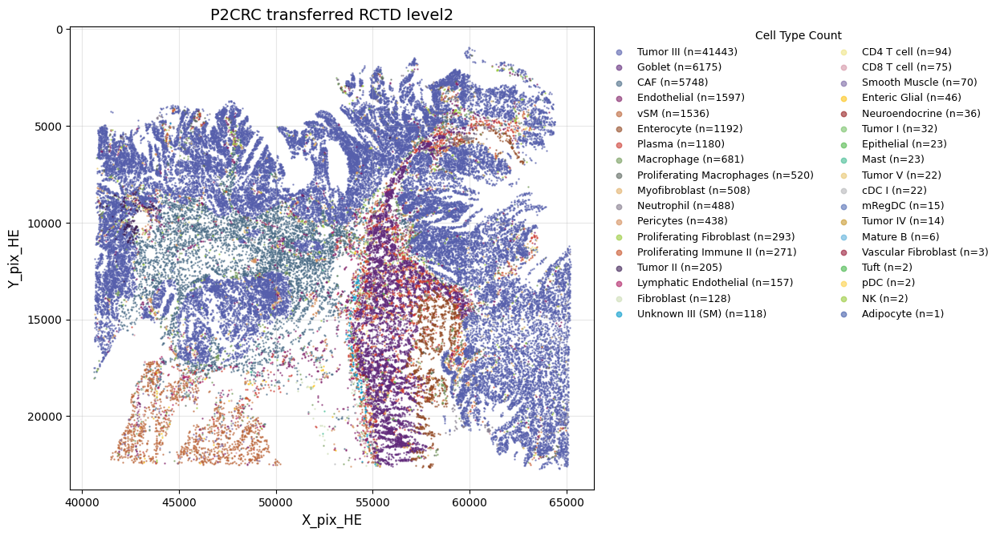

In [21]:
class_names_star = globals().get("class_names_star")
if class_names_star is None:
    class_names_star = class_names

_nbr_star = globals().get("spatial_neighbor_index_star")
all_acc, all_macro_f1, all_weighted_f1, all_preds, all_labels = evaluate_and_plot_on_all_data(
    model=model_star,
    matched_features_path=matched_features_stardist_path,
    class_names=class_names_star,
    evaluate=evaluate,
    plot_celltype_spatial_distribution=plot_celltype_spatial_distribution,
    CellTypeDataset=CellTypeDataset,
    device=device,
    scaler=scaler,
    val_loader=None,
    prediction_only=True,
    X_coords_matched=X_coords_star if "X_coords_star" in globals() else None,
    y_level1_f=y_star_level1 if "y_star_level1" in globals() else None,
    celltype_pred_dir=result_fig("stardist_pred_level2"),
    # celltype_true_dir=result_fig("stardist_true_level2"),
    spatial_plot_mode="pred_true_l2",
    pan_organ=PAN_ORGAN,
    spatial_title_pred_l2=f"{therapy_data} StarDist pred level2",
    spatial_title_true_l2=f"{therapy_data} transferred RCTD level2",
    celltype_pixel_NCRT_tumor1=celltype_pixel_NCRT_tumor1 if "celltype_pixel_NCRT_tumor1" in globals() else None,
    neighbor_index=_nbr_star,
)


Number of valid data points: 63166
Number of cell types: 4


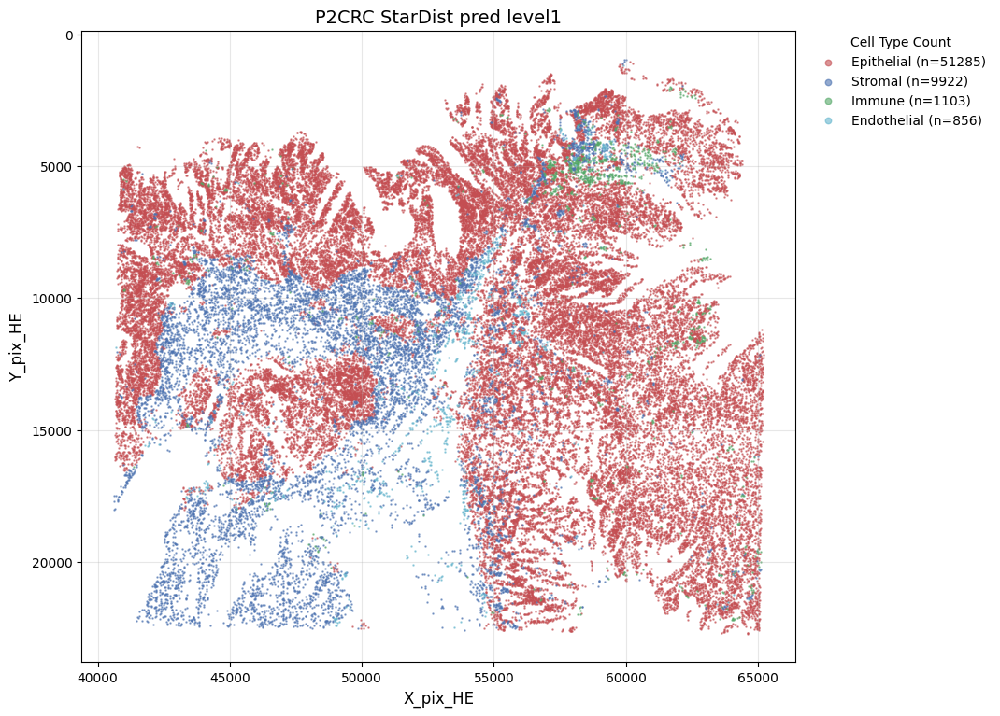

  Saved level1 predicted spatial plot: /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/celltype_pred_stardist_level1.jpg
Number of valid data points: 63166
Number of cell types: 4


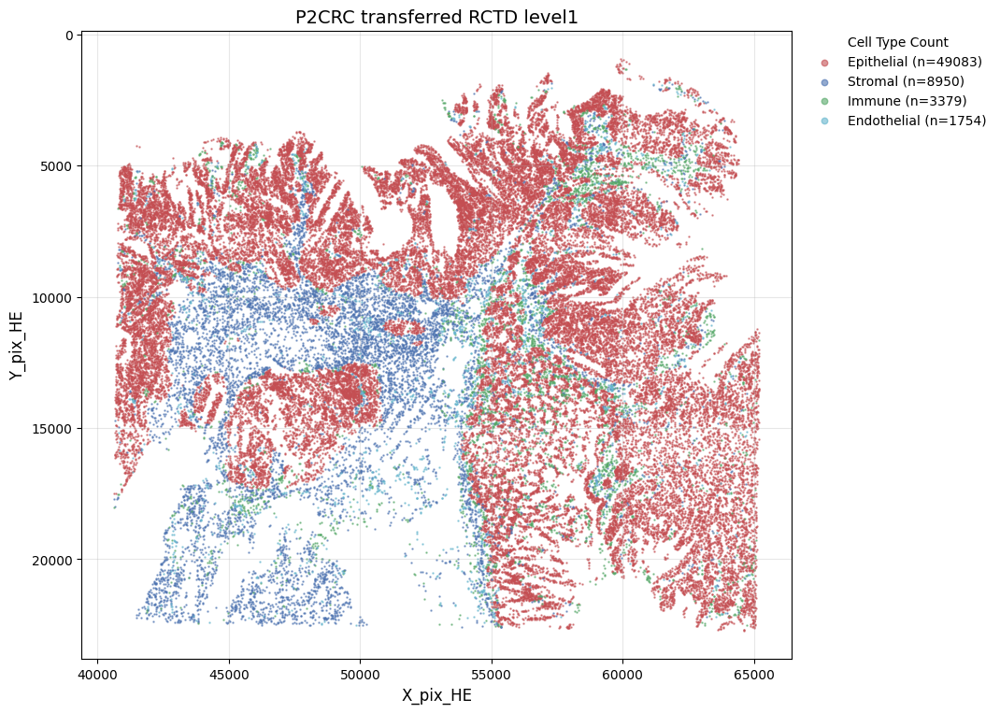

Saved: /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/celltype_pred_stardist_level1.jpg


In [22]:
# L2→L1 mapping comes from HE cv_data (same class_names / le_* as the trained model).
# Do not le_level2.transform(y_star): StarDist matched cells can include CT labels absent from training.
# Keep the StarDist plot aligned with the registered Xenium CRC coarse palette.
plot_level1_spatial_distribution(
    matched_features_path=matched_features_stardist_path,
    all_preds=all_preds,
    class_names_level1=class_names_level1,
    class_names=class_names,
    y_encoded_f=y_encoded_f,
    y_level1_encoded_f=y_level1_encoded_f,
    plot_celltype_spatial_distribution=plot_celltype_spatial_distribution,
    save_path_pred=result_fig("stardist_pred_level1"),
    # save_path_true=result_fig("stardist_true_level1"),
    pan_organ=PAN_ORGAN,
    fig_size=(10, 8),
    show=True,
    X_coords_matched=X_coords_star,
    y_level1_f=y_star_level1,
    spatial_title_pred_l1=f"{therapy_data} StarDist pred level1",
    spatial_title_true_l1=f"{therapy_data} transferred RCTD level1",
)
print(f"Saved: {result_fig('stardist_pred_level1')}")



L12 sublineage (StarDist)
Number of valid data points: 63166
Number of cell types: 6


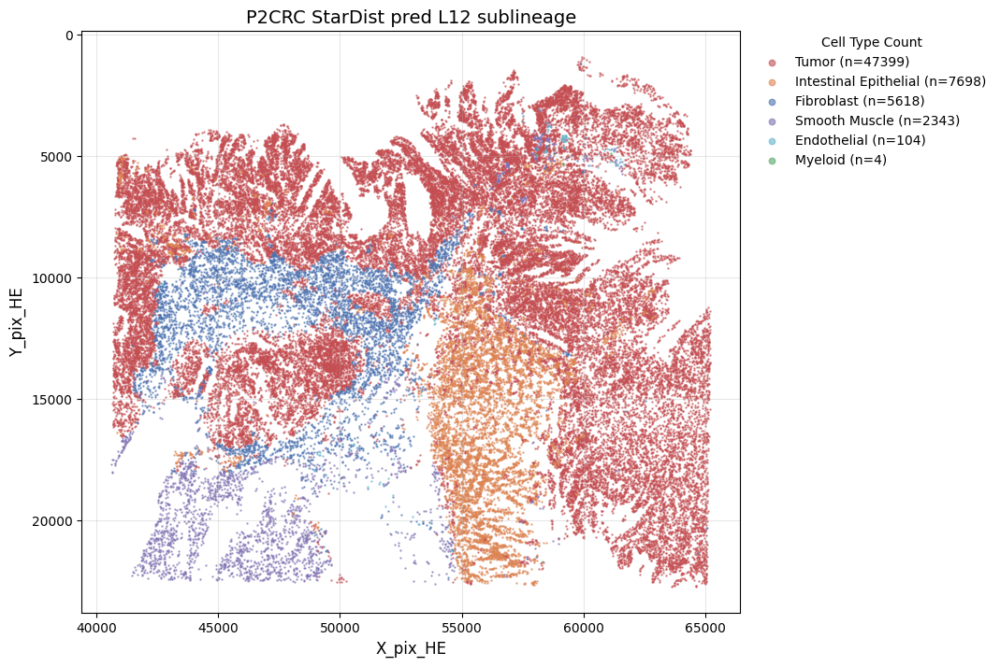

  Saved predicted spatial plot: /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/celltype_pred_stardist_level12.jpg
Number of valid data points: 63166
Number of cell types: 9


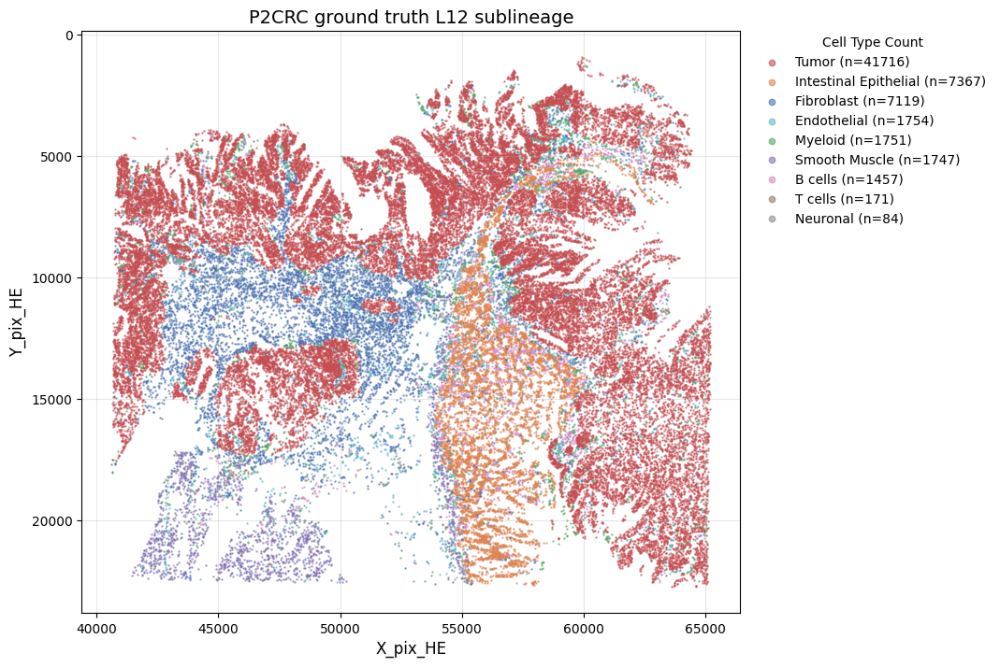

  Saved ground-truth spatial plot: /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/celltype_true_stardist_level12.jpg
Saved: /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/celltype_pred_stardist_level12.jpg
Skip L3 CNiche: missing preds_l3
Skip L4 TNiche: missing preds_l4


In [23]:
## StarDist: L12 intermediate hierarchy spatial — predicted vs transferred RCTD
if not hasattr(model_star, "level12_head"):
    print("Skip StarDist L12/L3/L4 spatial: model_star is not five-head / three-head.")
else:
    _star_heads = stardist_head_preds(
        model_star,
        scaler,
        X_star,
        device,
        predict_all_label_heads,
        neighbor_index=globals().get("spatial_neighbor_index_star"),
    )
    plot_stardist_spatial_extra(
        plot_tier_spatial_distribution,
        plot_celltype_spatial_distribution,
        result_fig,
        therapy_data,
        X_coords_star,
        _star_heads,
        cv_data if "cv_data" in globals() else None,
        globals(),
        pan_organ=PAN_ORGAN,
    )


Visualizing per-class accuracy...
  ✓ Computed metrics for 36 classes
Figure saved to /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/acc_level2_stardist.pdf


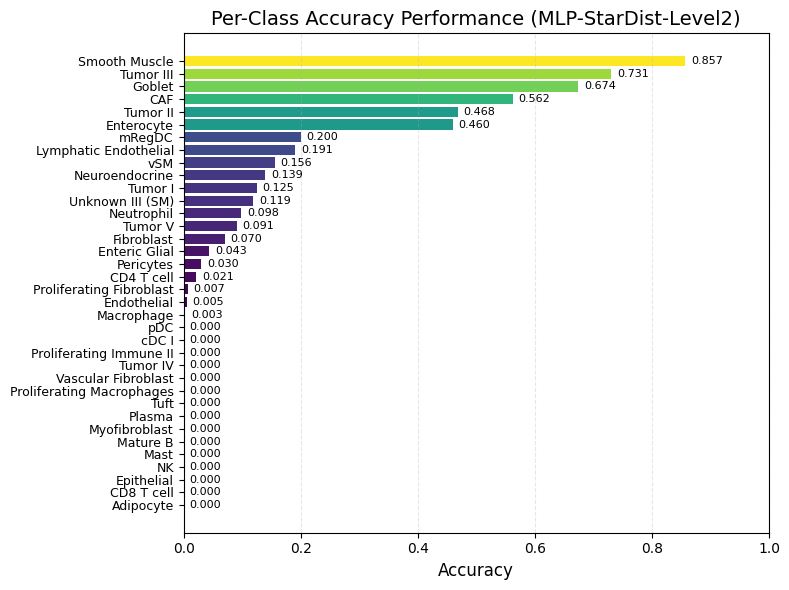


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 36
  Actual classes in test set: 36
  Model parameters: 2,771,505
  Test Accuracy: 0.6137
  Test Macro F1: 0.0837
  Test Weighted F1: 0.6411
Saved: /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/acc_level2_stardist.pdf
  Level1 metrics from level2 preds: acc=0.8033, macro_f1=0.4187, weighted_f1=0.7855
Visualizing per-class accuracy...
  ✓ Computed metrics for 4 classes
Figure saved to /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/acc_level1_stardist.pdf


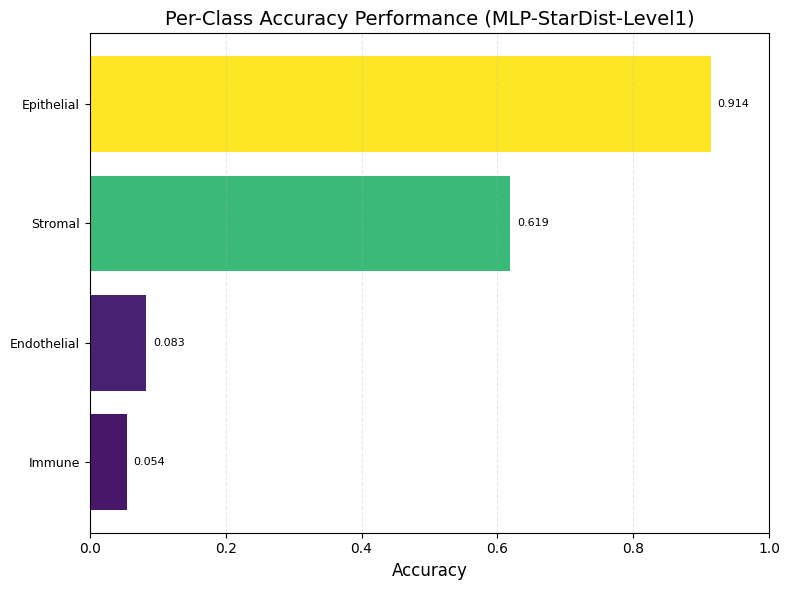


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 4
  Actual classes in test set: 4
  Model parameters: 2,771,505
  Test Accuracy: 0.8033
  Test Macro F1: 0.4187
  Test Weighted F1: 0.7855
Saved: /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/acc_level1_stardist.pdf
  Level1 metrics from L1 head: acc=0.5875, macro_f1=0.3937, weighted_f1=0.6661
Visualizing per-class accuracy...
  ✓ Computed metrics for 4 classes
Figure saved to /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/acc_level1_stardist_L1head.pdf


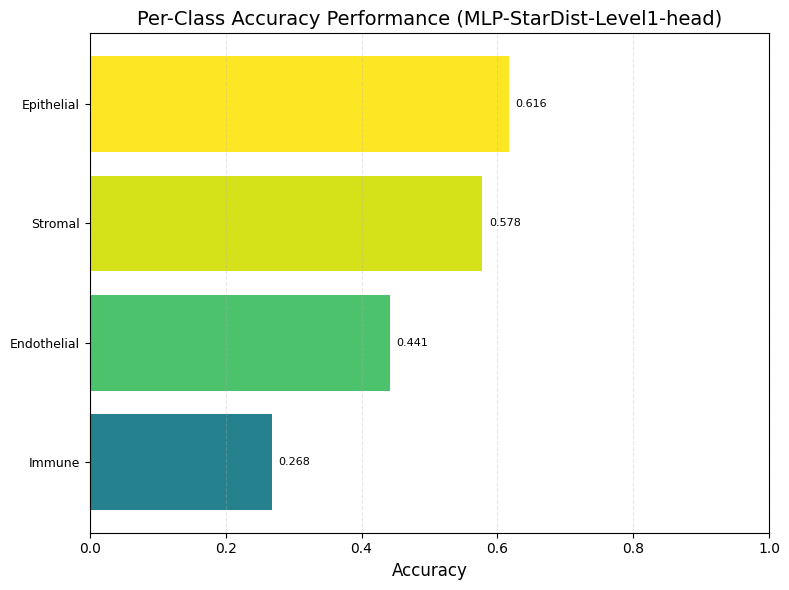


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 4
  Actual classes in test set: 4
  Model parameters: 2,771,505
  Test Accuracy: 0.5875
  Test Macro F1: 0.3937
  Test Weighted F1: 0.6661
Saved: /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/acc_level1_stardist_L1head.pdf

L12 sublineage (StarDist): acc=0.7835, macro_f1=0.3106
Visualizing per-class accuracy...
  ✓ Computed metrics for 9 classes
Figure saved to /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/acc_level12_stardist.pdf


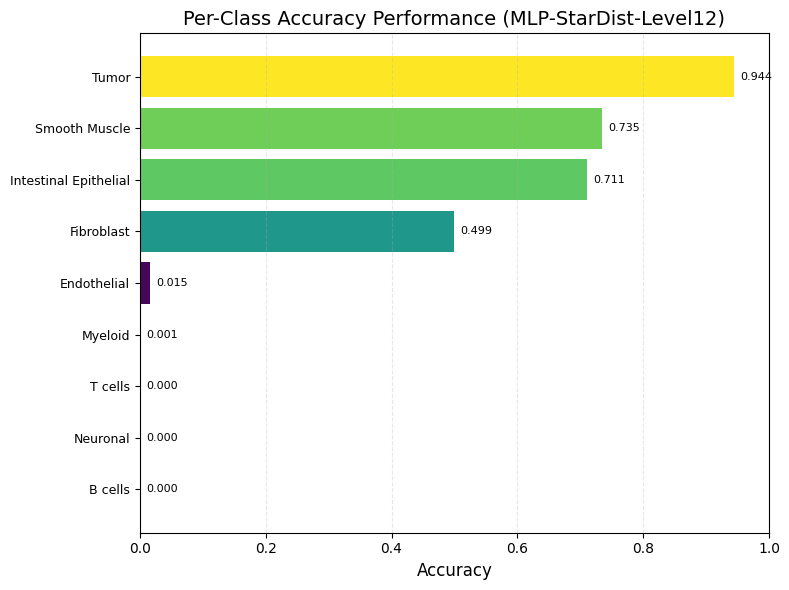


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 9
  Actual classes in test set: 9
  Model parameters: 2,771,505
  Test Accuracy: 0.7835
  Test Macro F1: 0.3106
  Test Weighted F1: 0.7460
Saved: /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/acc_level12_stardist.pdf
Skip L3 CNiche: missing preds_l3
Skip L4 TNiche: missing preds_l4


In [24]:
## StarDist per-class accuracy (run after StarDist evaluate cell)
class_names_star = globals().get("class_names_star")
if class_names_star is None:
    class_names_star = class_names

metrics_acc_star = plot_per_class_accuracy(
    all_labels,
    all_preds,
    class_names_star,
    model=model_star,
    device=device,
    train_dataset=None,
    val_dataset=None,
    input_dim=None,
    best_epoch=None,
    test_acc=all_acc,
    test_macro_f1=all_macro_f1,
    test_weighted_f1=all_weighted_f1,
    model_name="MLP-StarDist-Level2",
    y_sort_by="acc_asc",
    save_path=result_fig("acc_level2_stardist"),
)
print(f"Saved: {result_fig('acc_level2_stardist')}")

metrics_acc_star_l1 = plot_level1_accuracy_from_level2_predictions(
    matched_features_path=matched_features_stardist_path,
    all_preds=all_preds,
    class_names=class_names_star,
    class_names_level1=class_names_level1,
    y_encoded_f=y_encoded_f,
    y_level1_encoded_f=y_level1_encoded_f,
    plot_per_class_accuracy=plot_per_class_accuracy,
    model=model_star,
    device=device,
    model_name="MLP-StarDist-Level1",
    y_sort_by="acc_asc",
    save_path=result_fig("acc_level1_stardist"),
)
if metrics_acc_star_l1 is not None:
    print(f"Saved: {result_fig('acc_level1_stardist')}")

metrics_acc_star_l1_head = plot_level1_accuracy_from_level1_head(
    matched_features_path=matched_features_stardist_path,
    model=model_star,
    device=device,
    scaler=scaler,
    class_names_level1=class_names_level1,
    plot_per_class_accuracy=plot_per_class_accuracy,
    train_dataset=None,
    val_dataset=None,
    input_dim=None,
    best_epoch=None,
    model_name="MLP-StarDist-Level1-head",
    y_sort_by="acc_asc",
    save_path=result_fig("acc_level1_stardist_L1head"),
    neighbor_index=globals().get("spatial_neighbor_index_star"),
)
if metrics_acc_star_l1_head is not None:
    print(f"Saved: {result_fig('acc_level1_stardist_L1head')}")

if not hasattr(model_star, "level12_head"):
    print("Skip StarDist L12/L3/L4 per-class accuracy: model_star is not five-head / three-head.")
else:
    _star_heads = stardist_head_preds(
        model_star,
        scaler,
        X_star,
        device,
        predict_all_label_heads,
        neighbor_index=globals().get("spatial_neighbor_index_star"),
    )
    plot_stardist_acc_extra(plot_per_class_accuracy, result_fig, model_star, device, _star_heads, cv_data if "cv_data" in globals() else None, globals())


Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/conf_matrix_level2_stardist.pdf


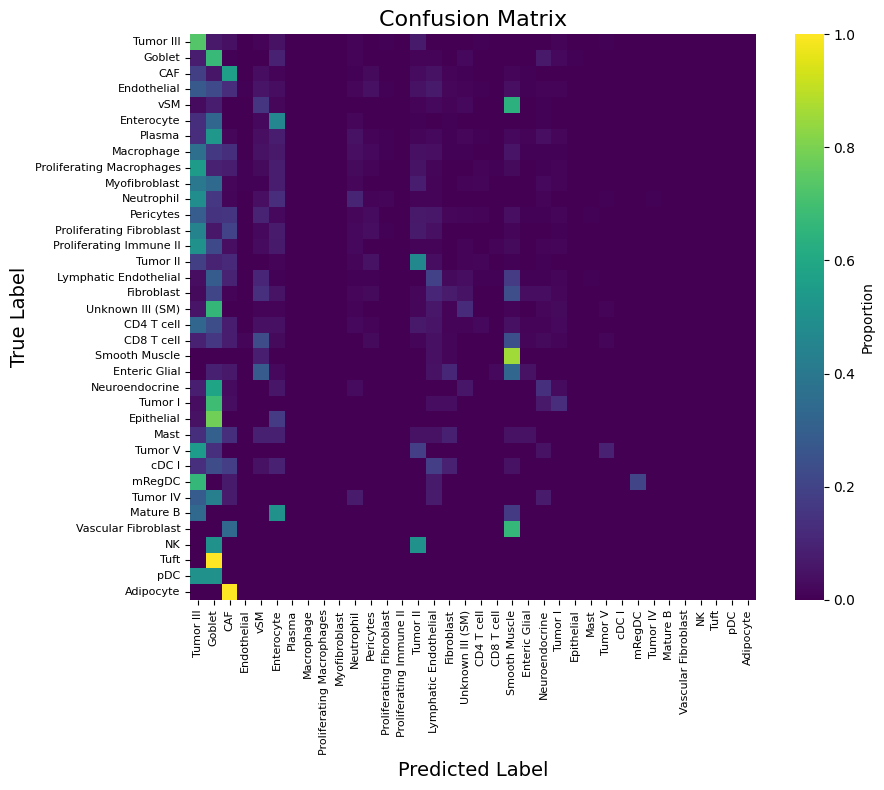

Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/conf_matrix_level1_stardist.pdf


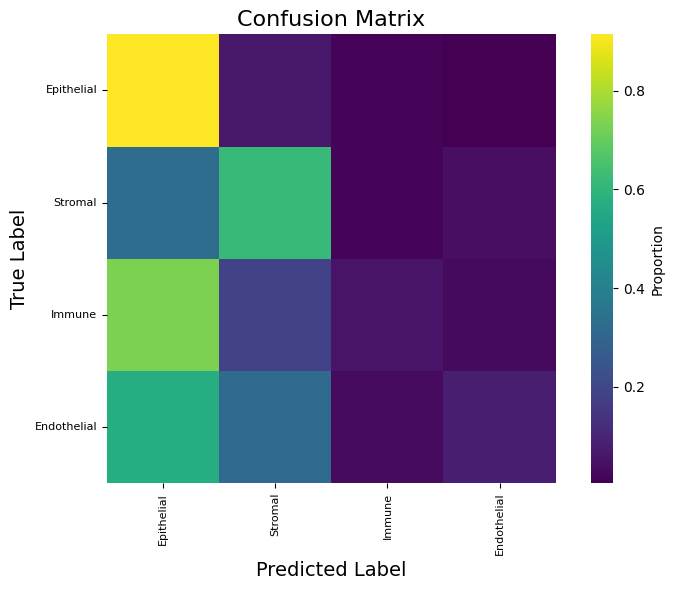


L12 sublineage (StarDist) confusion matrix
Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/conf_matrix_level12_stardist.pdf


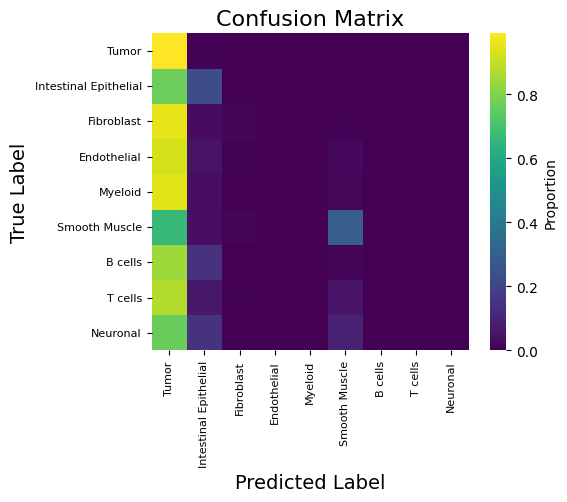

Saved: /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/conf_matrix_level12_stardist.pdf
Skip L3 CNiche: missing preds_l3
Skip L4 TNiche: missing preds_l4


In [25]:
# StarDist prediction heatmaps (confusion matrices): level2 + level1
class_names_star = globals().get("class_names_star")
if class_names_star is None:
    class_names_star = class_names

plot_confusion_matrix(
    all_labels,
    all_preds,
    class_names_star,
    figsize=(10, 8),
    save_path=result_fig("conf_matrix_level2_stardist"),
)

_loaded_star = load_matched_features_bundle(matched_features_stardist_path)
if "y_level1" in _loaded_star:
    _preds_arr = np.asarray(all_preds, dtype=np.int64)
    _n = min(len(_preds_arr), len(_loaded_star["y_level1"]))
    _preds_arr = _preds_arr[:_n]
    _y_true_l1_raw = _loaded_star["y_level1"][:_n]
    _l2_ok = (_preds_arr >= 0) & (_preds_arr < len(class_names_star))
    _child_to_parent = np.full(len(class_names_star), -1, dtype=np.int64)
    for _l2, _l1 in zip(y_encoded_f, y_level1_encoded_f):
        _l2_i, _l1_i = int(_l2), int(_l1)
        if _child_to_parent[_l2_i] == -1:
            _child_to_parent[_l2_i] = _l1_i
    _preds_l1 = _child_to_parent[_preds_arr[_l2_ok]]
    _y_true_l1_raw = _y_true_l1_raw[_l2_ok]

    if getattr(_y_true_l1_raw, "dtype", None) is not None and _y_true_l1_raw.dtype.kind in ["U", "S", "O"]:
        _name_to_idx = {str(c): i for i, c in enumerate(class_names_level1)}
        _y_true_l1 = np.array([_name_to_idx.get(str(v), -1) for v in _y_true_l1_raw], dtype=np.int64)
    else:
        _y_true_l1 = np.asarray(_y_true_l1_raw, dtype=np.int64)

    _n = min(len(_y_true_l1), len(_preds_l1))
    _y_true_l1 = _y_true_l1[:_n]
    _preds_l1 = _preds_l1[:_n]
    _valid = _y_true_l1 >= 0

    if np.any(_valid):
        plot_confusion_matrix(
            _y_true_l1[_valid],
            _preds_l1[_valid],
            class_names_level1,
            figsize=(8, 6),
            save_path=result_fig("conf_matrix_level1_stardist"),
        )
    else:
        print("Skip level1 StarDist confusion matrix: no valid y_level1 labels.")
else:
    print(f"Skip level1 StarDist confusion matrix: y_level1 not found in {matched_features_stardist_path}")

if not hasattr(model_star, "level12_head"):
    print("Skip StarDist L12/L3/L4 confusion matrices: model_star is not five-head.")
else:
    _star_heads = stardist_head_preds(model_star, scaler, X_star, device, predict_all_label_heads)
    plot_stardist_confusion_extra(plot_confusion_matrix, result_fig, _star_heads, cv_data if "cv_data" in globals() else None, globals())


Visualizing per-class performance...
  ✓ Computed metrics for 36 classes
Figure saved to /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/f1_level2_stardist.pdf


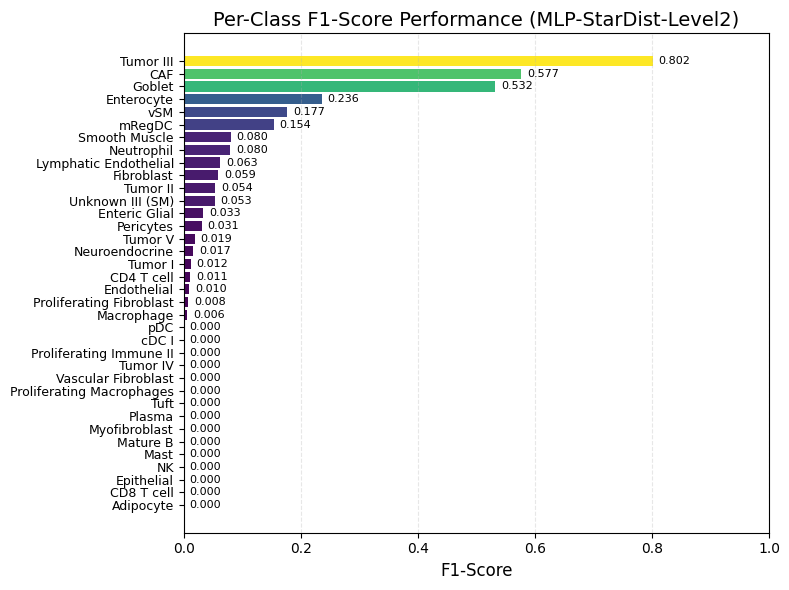


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 36
  Actual classes in test set: 36
  Model parameters: 2,771,505
  Test Accuracy: 0.6137
  Test Macro F1: 0.0837
  Test Weighted F1: 0.6411
  Level1 F1 plot from level2 preds (same mapping as accuracy helper): acc=0.8033, macro_f1=0.4187, weighted_f1=0.7855
Visualizing per-class performance...
  ✓ Computed metrics for 4 classes
Figure saved to /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/f1_level1_stardist.pdf


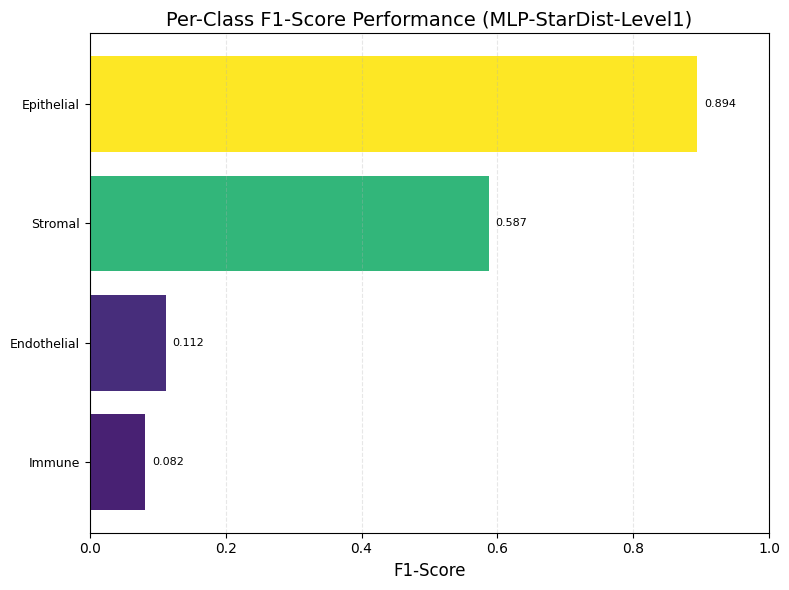


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 4
  Actual classes in test set: 4
  Model parameters: 2,771,505
  Test Accuracy: 0.8033
  Test Macro F1: 0.4187
  Test Weighted F1: 0.7855
  Level1 F1 plot from L1 head: acc=0.5875, macro_f1=0.3937, weighted_f1=0.6661
Visualizing per-class performance...
  ✓ Computed metrics for 4 classes
Figure saved to /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/f1_level1_stardist_L1head.pdf


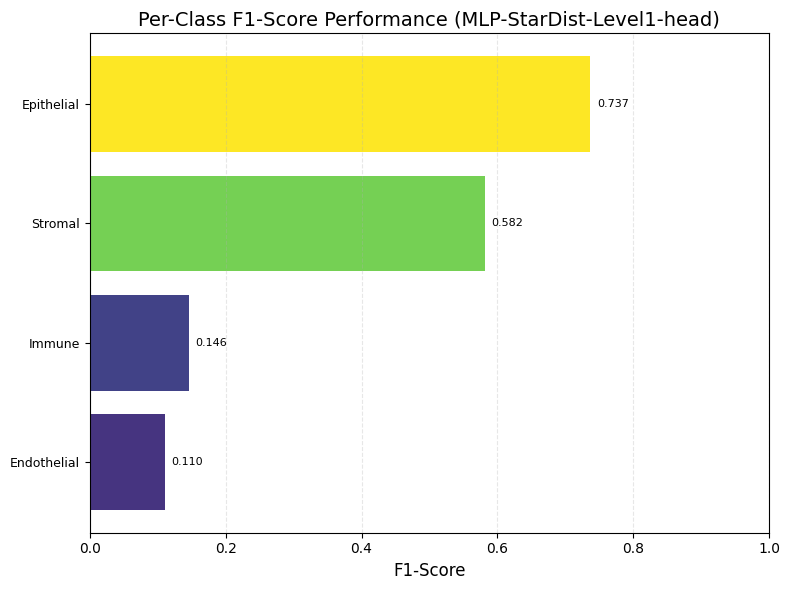


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 4
  Actual classes in test set: 4
  Model parameters: 2,771,505
  Test Accuracy: 0.5875
  Test Macro F1: 0.3937
  Test Weighted F1: 0.6661

L12 sublineage (StarDist) per-class F1
Visualizing per-class performance...
  ✓ Computed metrics for 9 classes
Figure saved to /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/f1_level12_stardist.pdf


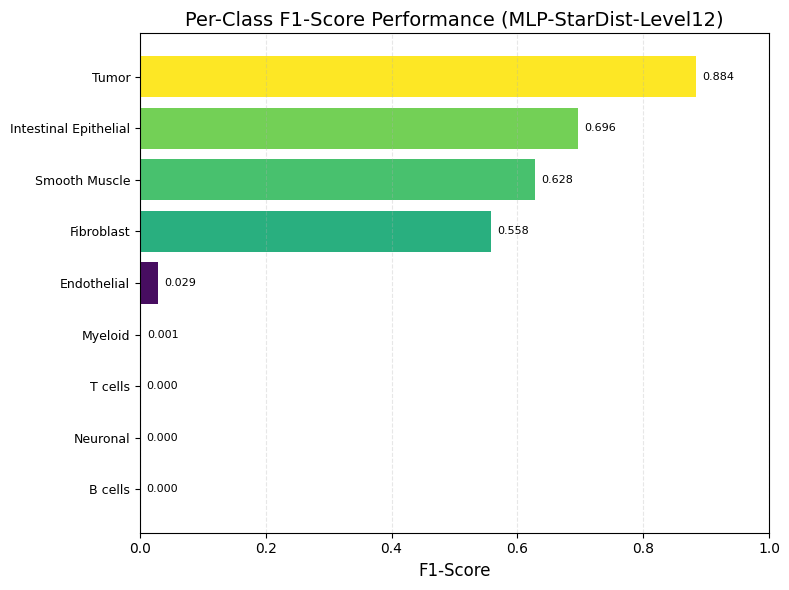


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 9
  Actual classes in test set: 9
  Model parameters: 2,771,505
  Test Accuracy: 0.7835
  Test Macro F1: 0.3106
  Test Weighted F1: 0.7460
Saved: /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/f1_level12_stardist.pdf
Skip L3 CNiche: missing preds_l3
Skip L4 TNiche: missing preds_l4


In [26]:
class_names_star = globals().get("class_names_star")
if class_names_star is None:
    class_names_star = class_names

metrics_f1_star = plot_per_class_f1(
    all_labels,
    all_preds,
    class_names_star,
    model=model_star,
    device=device,
    train_dataset=None,
    val_dataset=None,
    input_dim=None,
    best_epoch=None,
    test_acc=all_acc,
    test_macro_f1=all_macro_f1,
    test_weighted_f1=all_weighted_f1,
    y_sort_by="f1_asc",
    model_name="MLP-StarDist-Level2",
    save_path=result_fig("f1_level2_stardist"),
)

metrics_f1_star_l1 = plot_level1_f1_from_level2_predictions(
    matched_features_path=matched_features_stardist_path,
    all_preds=all_preds,
    class_names=class_names_star,
    class_names_level1=class_names_level1,
    y_encoded_f=y_encoded_f,
    y_level1_encoded_f=y_level1_encoded_f,
    plot_per_class_f1=plot_per_class_f1,
    model=model_star,
    device=device,
    y_sort_by="f1_asc",
    model_name="MLP-StarDist-Level1",
    save_path=result_fig("f1_level1_stardist"),
)

metrics_f1_star_l1_head = plot_level1_f1_from_level1_head(
    matched_features_path=matched_features_stardist_path,
    model=model_star,
    device=device,
    scaler=scaler,
    class_names_level1=class_names_level1,
    plot_per_class_f1=plot_per_class_f1,
    train_dataset=None,
    val_dataset=None,
    input_dim=None,
    best_epoch=None,
    y_sort_by="f1_asc",
    model_name="MLP-StarDist-Level1-head",
    save_path=result_fig("f1_level1_stardist_L1head"),
    neighbor_index=globals().get("spatial_neighbor_index_star"),
)

if not hasattr(model_star, "level12_head"):
    print("Skip StarDist L12/L3/L4 per-class F1: model_star is not five-head / three-head.")
else:
    _star_heads = stardist_head_preds(
        model_star,
        scaler,
        X_star,
        device,
        predict_all_label_heads,
        neighbor_index=globals().get("spatial_neighbor_index_star"),
    )
    plot_stardist_f1_extra(plot_per_class_f1, result_fig, model_star, device, _star_heads, cv_data if "cv_data" in globals() else None, globals())


  ROC colors: xenium_crc_fine (aligned with dataset spatial palette).
  ✓ Saved ROC figure: /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/roc_stardist_level2.pdf


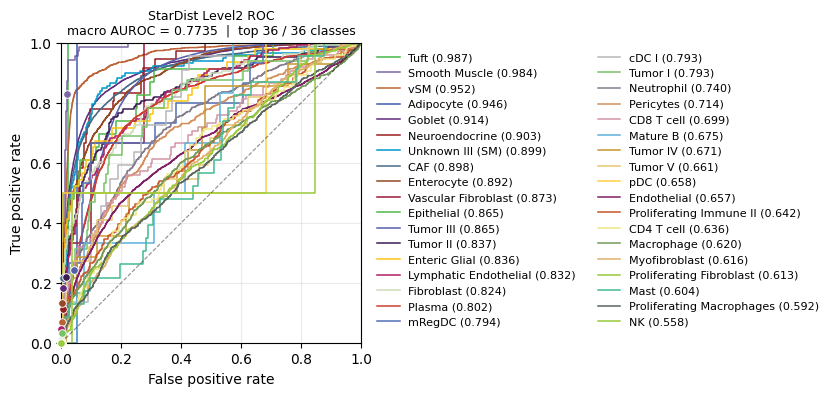

  ROC colors: xenium_crc_coarse (aligned with dataset spatial palette).
  ✓ Saved ROC figure: /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/roc_stardist_level1.pdf


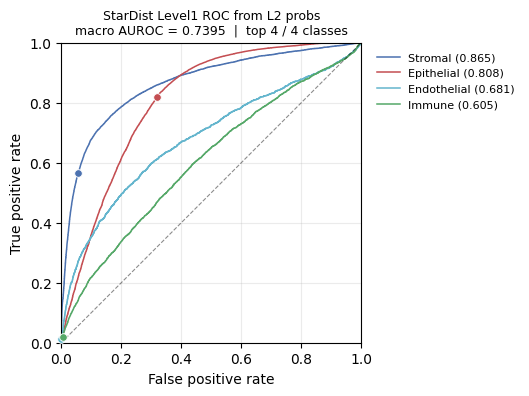

  ROC colors: xenium_crc_coarse (aligned with dataset spatial palette).
  ✓ Saved ROC figure: /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/roc_stardist_level1_L1head.pdf


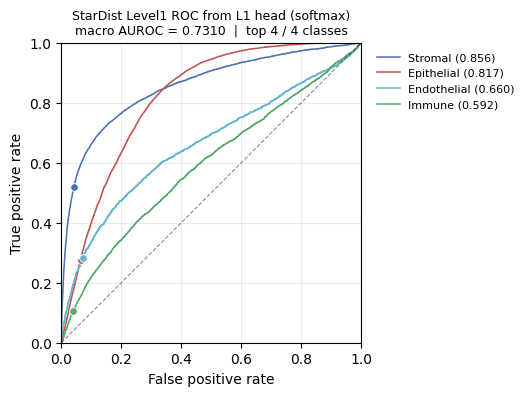


L12 sublineage (StarDist) ROC
  ROC colors: xenium_crc_intermediate (aligned with dataset spatial palette).
  ✓ Saved ROC figure: /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/roc_stardist_level12.pdf


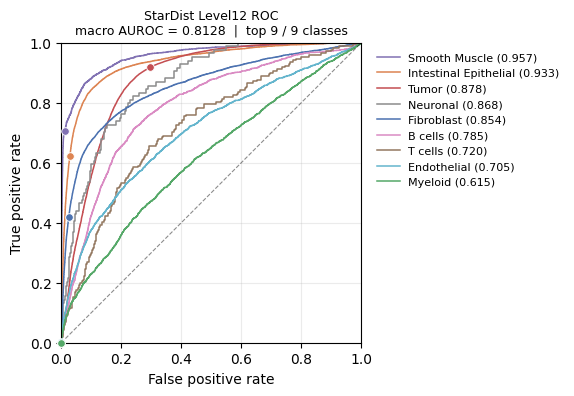

Saved: /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/roc_stardist_level12.pdf
Skip L3 CNiche ROC: missing probs l3
Skip L4 TNiche ROC: missing probs l4


In [27]:
import numpy as np

class_names_star = globals().get("class_names_star")
if class_names_star is None:
    class_names_star = class_names

_z = load_matched_features_bundle(matched_features_stardist_path)
X_star_scaled = scaler.transform(_z["X"])
_nbr_star = globals().get("spatial_neighbor_index_star")
probs_l2 = mlp_collect_softmax_probs(
    model_star, X_star_scaled, device, neighbor_index=_nbr_star
)

# Full-length five-head softmax for metrics CSV (ROC plots use valid subset below).
_probs_heads = None
if hasattr(model_star, "level12_head"):
    _probs_heads = mlp_collect_five_head_softmax_probs(
        model_star, X_star_scaled, device, neighbor_index=_nbr_star
    )

# Encode y from the same bundle as probs (training class_names indices; unknown CT → -1).
if "y" not in _z:
    print("Skip ROC: no y in matched features bundle.")
else:
    y_roc = encode_labels_with_class_names(_z["y"], class_names_star)
    m = min(len(probs_l2), len(y_roc))
    probs_m = probs_l2[:m]
    y_m = y_roc[:m]
    valid = (y_m >= 0) & (y_m < len(class_names_star))
    n_bad = int((~valid).sum())
    if n_bad:
        print(
            f"  Excluding {n_bad} StarDist cells whose final_CT is absent from "
            f"training class_names ({len(class_names_star)} classes) for ROC."
        )
    if not np.any(valid):
        print("Skip ROC: no valid training-aligned labels.")
    else:
        _y_l1_roc = _z["y_level1"][:m][valid] if "y_level1" in _z else None
        _X_roc = X_star_scaled[:m][valid]
        _probs_roc = probs_m[valid]
        _y_roc = y_m[valid]

        roc_info_l2 = plot_multiclass_roc_curves(
            _y_roc,
            _probs_roc,
            class_names_star,
            figsize=(3.0, 3.0),
            max_curves=len(class_names_star),
            save_path=result_fig("roc_stardist_level2"),
            title="StarDist Level2 ROC",
            pan_organ=PAN_ORGAN,
        )
        roc_info_l1 = plot_level1_roc_from_level2_scores(
            matched_features_stardist_path,
            _probs_roc,
            class_names_star,
            class_names_level1,
            y_encoded_f,
            y_level1_encoded_f,
            figsize=(3.0, 3.0),
            save_path=result_fig("roc_stardist_level1"),
            title="StarDist Level1 ROC from L2 probs",
            pan_organ=PAN_ORGAN,
            y_level1_f=_y_l1_roc,
        )

        roc_info_l1_head = plot_level1_roc_from_level1_head(
            matched_features_stardist_path,
            model_star,
            device,
            scaler,
            class_names_level1,
            figsize=(3.0, 3.0),
            save_path=result_fig("roc_stardist_level1_L1head"),
            title="StarDist Level1 ROC from L1 head (softmax)",
            pan_organ=PAN_ORGAN,
            X_f=_X_roc,
            y_level1_f=_y_l1_roc,
            neighbor_index=_nbr_star,
        )
        if hasattr(model_star, "level12_head"):
            _probs_heads_roc = {k: v[:m][valid] for k, v in _probs_heads.items()}
            plot_stardist_roc_extra(
                plot_multiclass_roc_curves,
                result_fig,
                _probs_heads_roc,
                cv_data if "cv_data" in globals() else None,
                len(_y_roc),
                globals(),
                pan_organ=PAN_ORGAN,
            )
        else:
            print("Skip StarDist L12/L3/L4 ROC: model_star is not five-head.")


In [28]:
## Save StarDist external validation metrics (matched h5ad; mirrors validation_internal_metrics.csv)
import importlib
import uni_label_cv_helpers as uni_nb
importlib.reload(uni_nb)
from uni_label_cv_helpers import (
    save_stardist_external_validation_metrics,
    plot_stardist_roc_from_auroc_csv,
    _auroc_csv_path_from_metrics,
)

class_names_star = globals().get("class_names_star")
if class_names_star is None:
    class_names_star = class_names

if "all_preds" not in globals() or "matched_features_stardist_path" not in globals():
    raise NameError("Run StarDist evaluate / per-class accuracy cells first.")

logo_summary = globals().get("logo_summary")
if logo_summary is None and isinstance(globals().get("LP"), dict):
    logo_summary = LP.get("logo_summary")

# Reuse ROC softmax if the ROC cell ran first (avoids a second forward pass).
_probs_l2 = globals().get("probs_l2")
_head_probs = globals().get("_probs_heads")

metrics_df, combined_df, tier_aucs = save_stardist_external_validation_metrics(
    all_labels=all_labels,
    all_preds=all_preds,
    matched_features_path=matched_features_stardist_path,
    class_names_star=class_names_star,
    class_names_level1=class_names_level1,
    y_encoded_f=y_encoded_f,
    y_level1_encoded_f=y_level1_encoded_f,
    therapy_data=therapy_data,
    metrics_csv_path=result_fig("validation_external_stardist_matched_metrics"),
    model_star=model_star if "model_star" in globals() else None,
    scaler=scaler,
    X_star=X_star if "X_star" in globals() else None,
    device=device,
    predict_all_label_heads=predict_all_label_heads,
    cv_data=cv_data if "cv_data" in globals() else None,
    g=globals(),
    logo_summary=logo_summary,
    hce_w1=globals().get("hce_w1", 1.0),
    hce_w2=globals().get("hce_w2", 1.0),
    hce_w12=globals().get("hce_w12", 2.0),
    hce_w_l12head=globals().get("hce_w_l12head", 1.0),
    hce_w_l3=globals().get("hce_w_l3", 1.0),
    hce_w_l4=globals().get("hce_w_l4", 1.0),
    probs_l2=_probs_l2,
    head_probs=_head_probs,
)

print("\nStarDist matched per-tier columns (insample_* = StarDist-matched cells, best-fold model):")
_tier_cols = [
    c for c in combined_df.columns
    if c.startswith(("insample_", "num_", "val_")) and ("auc" in c or not c.endswith("_std"))
]
print(combined_df[_tier_cols].tail(1).T)
print("\nMacro AUROC by tier:")
for _t, _v in sorted(tier_aucs.items()):
    print(f"  {_t}: {_v:.4f}")

_auroc_csv = _auroc_csv_path_from_metrics(result_fig("validation_external_stardist_matched_metrics"))
print(f"\nLevel2 AUROC table: {_auroc_csv}")


Skip L3 CNiche: missing preds_l3
Skip L4 TNiche: missing preds_l4
Current run metrics:
             timestamp            therapy_data  best_epoch hce_lambda  hce_w1  \
0  2026-09-15 01:12:30  P2CRC_stardist_matched          11       None     1.0   

   hce_w2  hce_w12  hce_w_l12head  hce_w_l3  hce_w_l4  ...  \
0     2.0      1.0            1.0       1.0       1.0  ...   

   insample_l12_macro_f1  insample_l12_weighted_f1  num_l1_head_classes  \
0               0.177333                  0.592573                    4   

   num_l12_classes  insample_l2_macro_auc  insample_l1_macro_auc  \
0                9                0.77349               0.739541   

   insample_l1_head_macro_auc  insample_l12_macro_auc  val_l2_macro_auc  \
0                    0.731042                0.812786           0.77349   

   val_l1_macro_auc  
0          0.739541  

[1 rows x 38 columns]

Saved comparison table to: /home/lingyu/ssd2/Python/Hist2Pheno/data/Xemium/CRC/Cases/P2CRC/project_all_UNI/result/vali

In [29]:
# # Replay Level2 ROC from validation_external_stardist_matched_AUROC.csv
# import importlib
# import uni_label_cv_helpers as uni_nb
# importlib.reload(uni_nb)
# from pathlib import Path
# from uni_label_cv_helpers import plot_stardist_roc_from_auroc_csv, _auroc_csv_path_from_metrics

# class_names_star = globals().get("class_names_star")
# if class_names_star is None:
#     class_names_star = class_names
# _auroc_csv = _auroc_csv_path_from_metrics(
#     result_fig("validation_external_stardist_matched_metrics")
# )
# if not Path(_auroc_csv).is_file():
#     raise FileNotFoundError(f"Run metrics cell first: {_auroc_csv}")

# roc_info_l2_csv = plot_stardist_roc_from_auroc_csv(
#     _auroc_csv,
#     class_names_star,
#     save_path=result_fig("roc_stardist_level2_from_AUROC_csv"),
#     title="StarDist Level2 ROC (from AUROC CSV)",
#     pan_organ=PAN_ORGAN,
# )
# if roc_info_l2_csv:
#     print(f"Macro AUROC from CSV: {roc_info_l2_csv['macro_auc']:.4f}")
